In [1]:
# Import libraries for data manipulation, visualization and model building.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.graphics.regressionplots import influence_plot
from sklearn.model_selection import train_test_split 
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('ToyotaCorolla - MLR.csv')
df

,Price,Age_08_04,KM,Fuel_Type,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
0,13500,23,46986,Diesel,90,0,2000,3,4,5,1165
1,13750,23,72937,Diesel,90,0,2000,3,4,5,1165
2,13950,24,41711,Diesel,90,0,2000,3,4,5,1165
3,14950,26,48000,Diesel,90,0,2000,3,4,5,1165
4,13750,30,38500,Diesel,90,0,2000,3,4,5,1170
...,...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,Petrol,86,0,1300,3,4,5,1025
1432,10845,72,19000,Petrol,86,0,1300,3,4,5,1015
1433,8500,71,17016,Petrol,86,0,1300,3,4,5,1015
1434,7250,70,16916,Petrol,86,0,1300,3,4,5,1015


In [3]:
df.rename(columns = {'Age_08_04':'Age'}, inplace = True)
df

,Price,Age,KM,Fuel_Type,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
0,13500,23,46986,Diesel,90,0,2000,3,4,5,1165
1,13750,23,72937,Diesel,90,0,2000,3,4,5,1165
2,13950,24,41711,Diesel,90,0,2000,3,4,5,1165
3,14950,26,48000,Diesel,90,0,2000,3,4,5,1165
4,13750,30,38500,Diesel,90,0,2000,3,4,5,1170
...,...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,Petrol,86,0,1300,3,4,5,1025
1432,10845,72,19000,Petrol,86,0,1300,3,4,5,1015
1433,8500,71,17016,Petrol,86,0,1300,3,4,5,1015
1434,7250,70,16916,Petrol,86,0,1300,3,4,5,1015


In [4]:
df.describe()

,Price,Age,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
count,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.00000,1436.000000,1436.0,1436.000000,1436.00000
mean,10730.824513,55.947075,68533.259749,101.502089,0.055710,1576.85585,4.033426,4.0,5.026462,1072.45961
std,3626.964585,18.599988,37506.448872,14.981080,0.229441,424.38677,0.952677,0.0,0.188510,52.64112
min,4350.000000,1.000000,1.000000,69.000000,0.000000,1300.00000,2.000000,4.0,3.000000,1000.00000
25%,8450.000000,44.000000,43000.000000,90.000000,0.000000,1400.00000,3.000000,4.0,5.000000,1040.00000
50%,9900.000000,61.000000,63389.500000,110.000000,0.000000,1600.00000,4.000000,4.0,5.000000,1070.00000
75%,11950.000000,70.000000,87020.750000,110.000000,0.000000,1600.00000,5.000000,4.0,5.000000,1085.00000
max,32500.000000,80.000000,243000.000000,192.000000,1.000000,16000.00000,5.000000,4.0,6.000000,1615.00000


In [5]:
df.duplicated().sum()

1

In [6]:
df = df.drop_duplicates()

In [7]:
df.reset_index(inplace=True,drop=True)

In [8]:
df['Fuel_Type'].unique()

array(['Diesel', 'Petrol', 'CNG'], dtype=object)

In [9]:
df['Fuel_Type'].value_counts()

Fuel_Type
Petrol    1264
Diesel     154
CNG         17
Name: count, dtype: int64

In [10]:
df = pd.get_dummies(data=df,columns= ['Fuel_Type'], dtype=int)
df

,Price,Age,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,2000,3,4,5,1165,0,1,0
1,13750,23,72937,90,0,2000,3,4,5,1165,0,1,0
2,13950,24,41711,90,0,2000,3,4,5,1165,0,1,0
3,14950,26,48000,90,0,2000,3,4,5,1165,0,1,0
4,13750,30,38500,90,0,2000,3,4,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1430,7500,69,20544,86,0,1300,3,4,5,1025,0,0,1
1431,10845,72,19000,86,0,1300,3,4,5,1015,0,0,1
1432,8500,71,17016,86,0,1300,3,4,5,1015,0,0,1
1433,7250,70,16916,86,0,1300,3,4,5,1015,0,0,1


<Axes: xlabel='Price', ylabel='KM'>

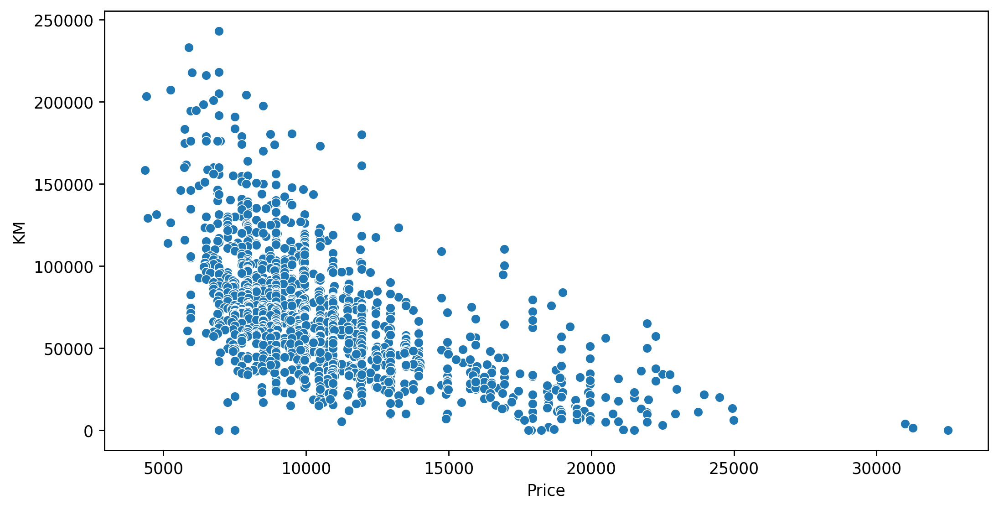

In [11]:
sns.scatterplot(x=df['Price'], y=df['KM'])

In [12]:
df.corr()

,Price,Age,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
Price,1.000000,-0.876273,-0.569420,0.314134,0.033928,0.124375,0.183604,NaN,0.063831,0.575869,-0.039449,0.046612,-0.031356
Age,-0.876273,1.000000,0.504575,-0.155293,0.031354,-0.096549,-0.146929,NaN,-0.005629,-0.466484,0.002198,-0.093058,0.088169
KM,-0.569420,0.504575,1.000000,-0.332904,-0.082168,0.103822,-0.035193,NaN,0.014890,-0.023969,0.144013,0.407497,-0.437397
HP,0.314134,-0.155293,-0.332904,1.000000,0.013313,0.035207,0.091803,NaN,0.209642,0.087143,0.062203,-0.537116,0.492362
Automatic,0.033928,0.031354,-0.082168,0.013313,1.000000,0.066934,-0.027492,NaN,-0.098582,0.058499,0.001467,-0.084248,0.079997
cc,0.124375,-0.096549,0.103822,0.035207,0.066934,1.000000,0.079254,NaN,0.014732,0.335077,0.006019,0.326780,-0.314200
Doors,0.183604,-0.146929,-0.035193,0.091803,-0.027492,0.079254,1.000000,NaN,-0.160101,0.301734,0.009761,0.023538,-0.025746
Cylinders,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gears,0.063831,-0.005629,0.014890,0.209642,-0.098582,0.014732,-0.160101,NaN,1.000000,0.021238,-0.049548,-0.048706,0.063079
Weight,0.575869,-0.466484,-0.023969,0.087143,0.058499,0.335077,0.301734,NaN,0.021238,1.000000,0.053530,0.564649,-0.557315


In [13]:
# As we the correlaion that we get for Cylinders is NaN we can drop it.
# The NaN value is generated in correlation matrix if the values in the respective column is same and do not vary.
corr = df.corr().dropna(how='all', axis=1).dropna(how='all')

In [14]:
corr

,Price,Age,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
Price,1.000000,-0.876273,-0.569420,0.314134,0.033928,0.124375,0.183604,0.063831,0.575869,-0.039449,0.046612,-0.031356
Age,-0.876273,1.000000,0.504575,-0.155293,0.031354,-0.096549,-0.146929,-0.005629,-0.466484,0.002198,-0.093058,0.088169
KM,-0.569420,0.504575,1.000000,-0.332904,-0.082168,0.103822,-0.035193,0.014890,-0.023969,0.144013,0.407497,-0.437397
HP,0.314134,-0.155293,-0.332904,1.000000,0.013313,0.035207,0.091803,0.209642,0.087143,0.062203,-0.537116,0.492362
Automatic,0.033928,0.031354,-0.082168,0.013313,1.000000,0.066934,-0.027492,-0.098582,0.058499,0.001467,-0.084248,0.079997
cc,0.124375,-0.096549,0.103822,0.035207,0.066934,1.000000,0.079254,0.014732,0.335077,0.006019,0.326780,-0.314200
Doors,0.183604,-0.146929,-0.035193,0.091803,-0.027492,0.079254,1.000000,-0.160101,0.301734,0.009761,0.023538,-0.025746
Gears,0.063831,-0.005629,0.014890,0.209642,-0.098582,0.014732,-0.160101,1.000000,0.021238,-0.049548,-0.048706,0.063079
Weight,0.575869,-0.466484,-0.023969,0.087143,0.058499,0.335077,0.301734,0.021238,1.000000,0.053530,0.564649,-0.557315
Fuel_Type_CNG,-0.039449,0.002198,0.144013,0.062203,0.001467,0.006019,0.009761,-0.049548,0.053530,1.000000,-0.037964,-0.297688


In [15]:
df

,Price,Age,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,2000,3,4,5,1165,0,1,0
1,13750,23,72937,90,0,2000,3,4,5,1165,0,1,0
2,13950,24,41711,90,0,2000,3,4,5,1165,0,1,0
3,14950,26,48000,90,0,2000,3,4,5,1165,0,1,0
4,13750,30,38500,90,0,2000,3,4,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1430,7500,69,20544,86,0,1300,3,4,5,1025,0,0,1
1431,10845,72,19000,86,0,1300,3,4,5,1015,0,0,1
1432,8500,71,17016,86,0,1300,3,4,5,1015,0,0,1
1433,7250,70,16916,86,0,1300,3,4,5,1015,0,0,1


<Axes: >

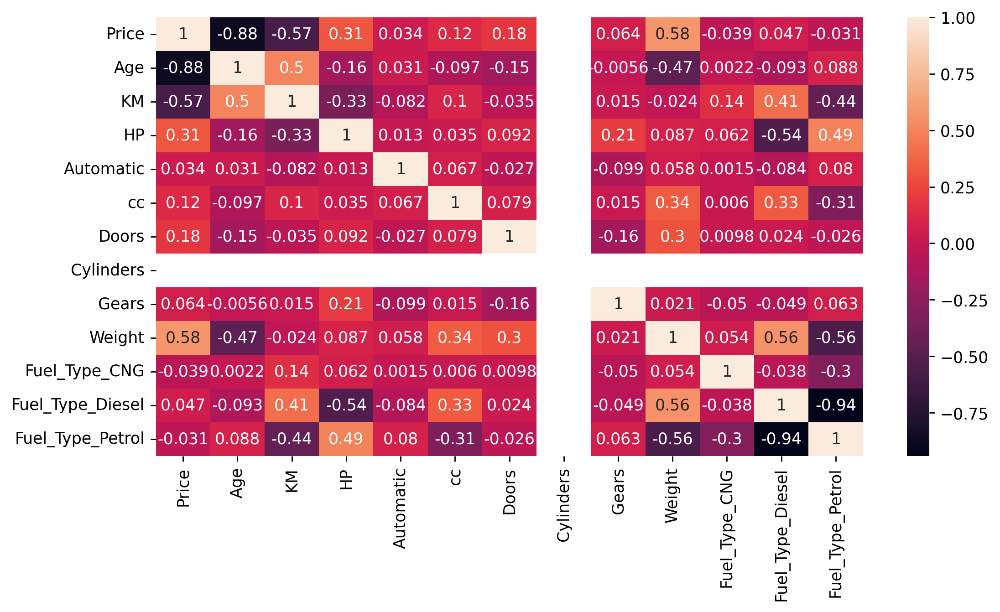

In [16]:
sns.heatmap(df.corr(), annot = True)

In [17]:
sns.pairplot(df)

In [18]:
x=[]
for feature in df.columns:
    if len(df[feature].unique())<20:
        x.append(feature)
dis = pd.DataFrame(x,columns=["Discrete features"])

In [19]:
y=[]
for feature in df.columns:
    if len(df[feature].unique())>20:
        y.append(feature)
cont = pd.DataFrame(y,columns=["Continuous features"])

In [20]:
dis_cont = pd.concat([dis,cont],axis=1)
dis_cont

,Discrete features,Continuous features
0,HP,Price
1,Automatic,Age
2,cc,KM
3,Doors,Weight
4,Cylinders,NaN
5,Gears,NaN
6,Fuel_Type_CNG,NaN
7,Fuel_Type_Diesel,NaN
8,Fuel_Type_Petrol,NaN


In [21]:
df_dis=df[x]
df_dis

,HP,Automatic,cc,Doors,Cylinders,Gears,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,90,0,2000,3,4,5,0,1,0
1,90,0,2000,3,4,5,0,1,0
2,90,0,2000,3,4,5,0,1,0
3,90,0,2000,3,4,5,0,1,0
4,90,0,2000,3,4,5,0,1,0
...,...,...,...,...,...,...,...,...,...
1430,86,0,1300,3,4,5,0,0,1
1431,86,0,1300,3,4,5,0,0,1
1432,86,0,1300,3,4,5,0,0,1
1433,86,0,1300,3,4,5,0,0,1


In [22]:
df_cont=df[y]
df_cont

,Price,Age,KM,Weight
0,13500,23,46986,1165
1,13750,23,72937,1165
2,13950,24,41711,1165
3,14950,26,48000,1165
4,13750,30,38500,1170
...,...,...,...,...
1430,7500,69,20544,1025
1431,10845,72,19000,1015
1432,8500,71,17016,1015
1433,7250,70,16916,1015


array([[<Axes: title={'center': 'Price'}>,
        <Axes: title={'center': 'Age'}>],
       [<Axes: title={'center': 'KM'}>,
        <Axes: title={'center': 'Weight'}>]], dtype=object)

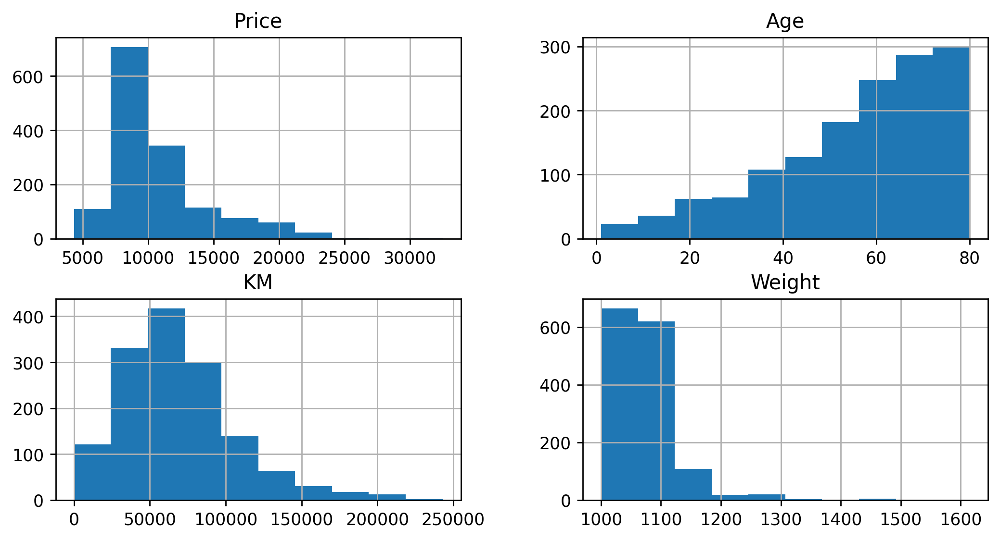

In [23]:
#Visualizing continuous features

df_cont.hist()

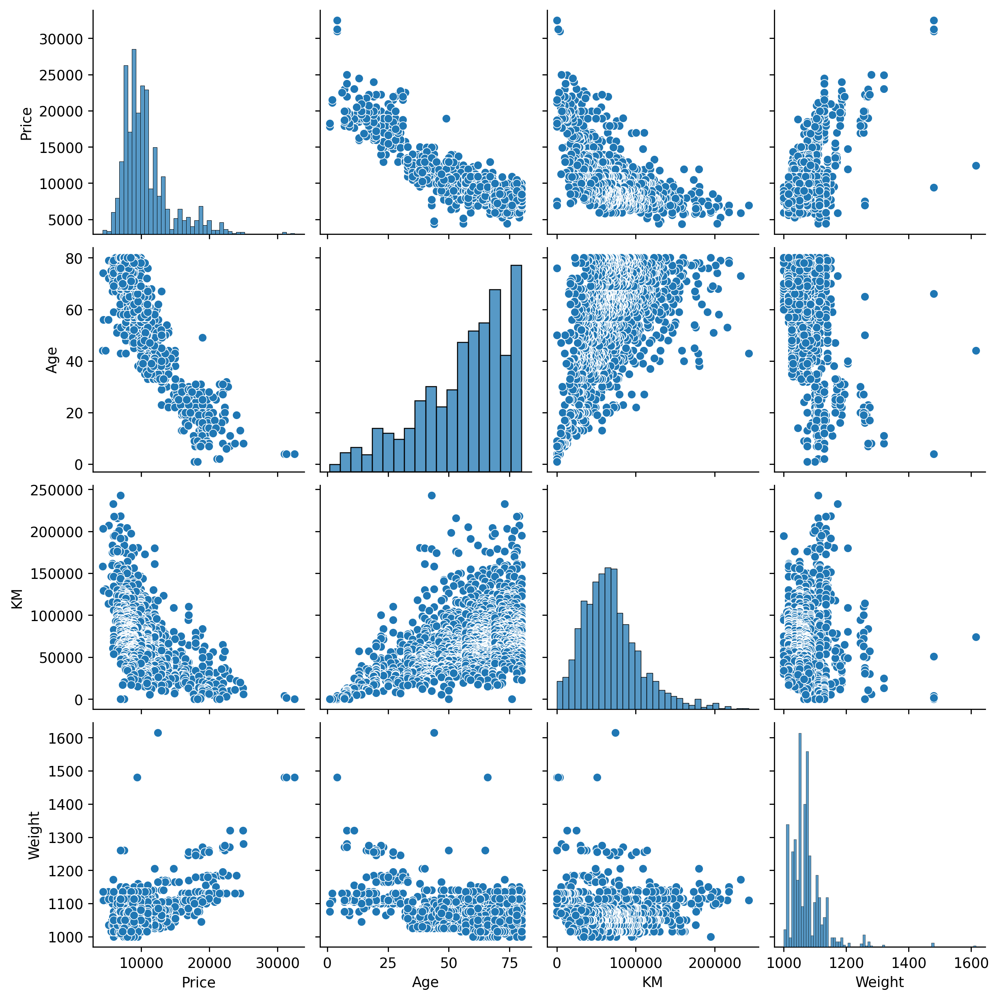

In [24]:
sns.pairplot(df_cont)

<Axes: >

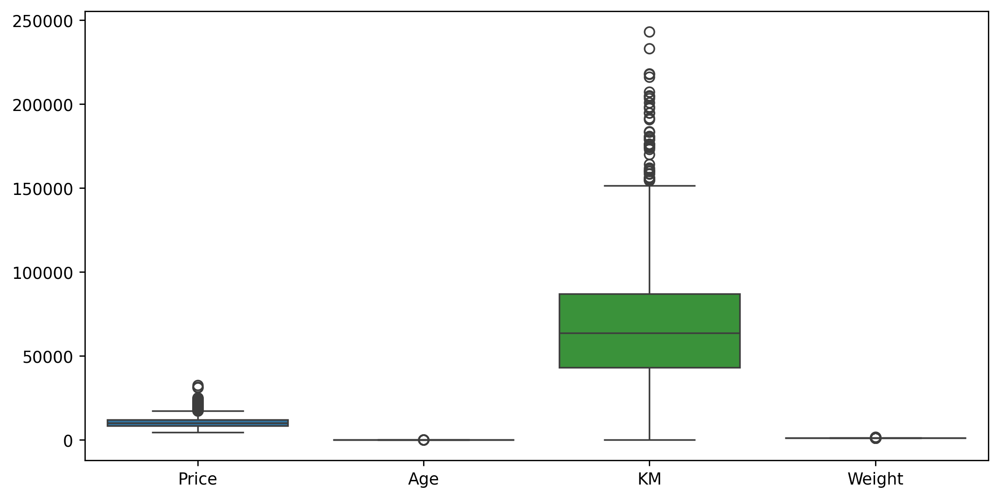

In [25]:
sns.boxplot(df_cont)

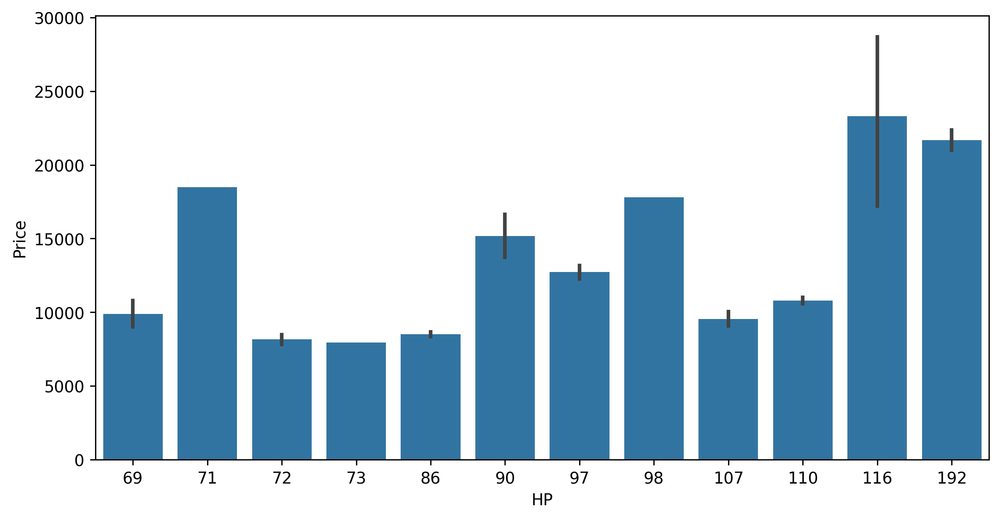

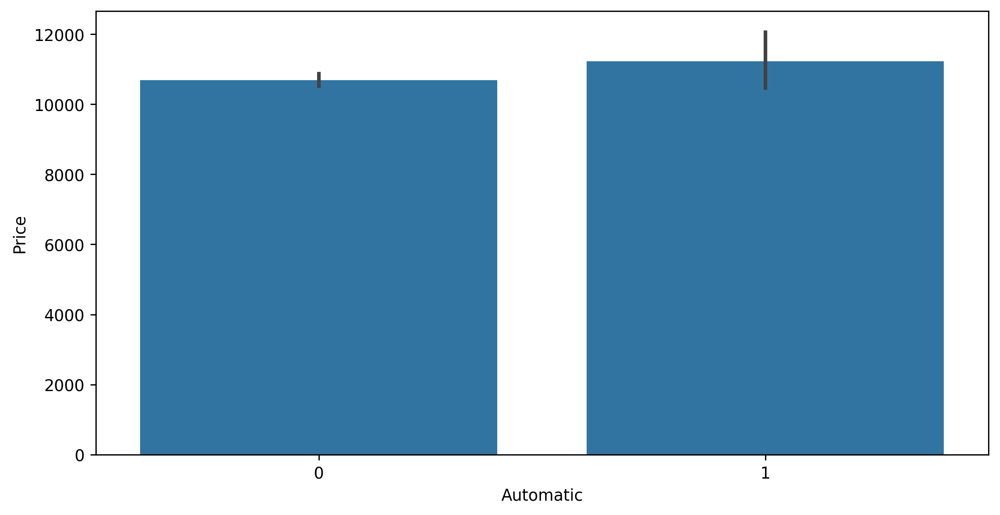

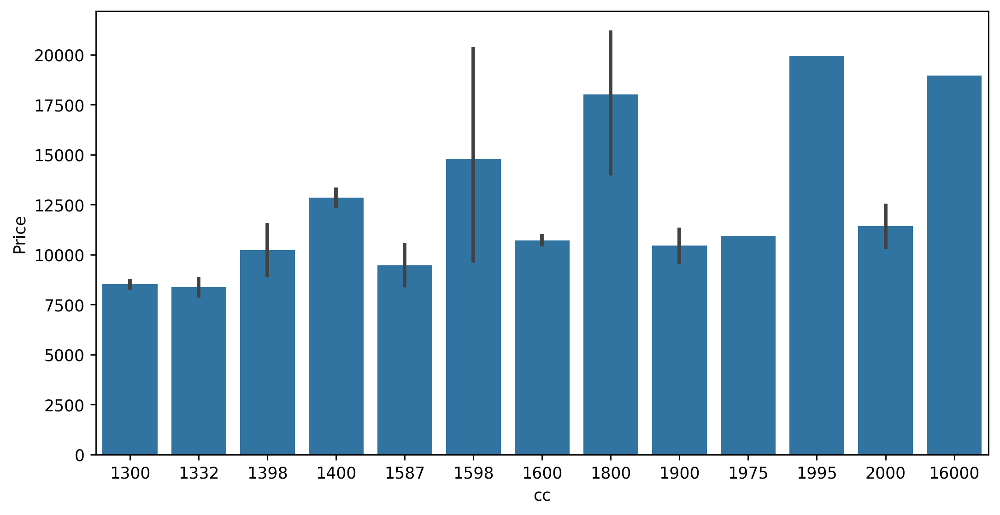

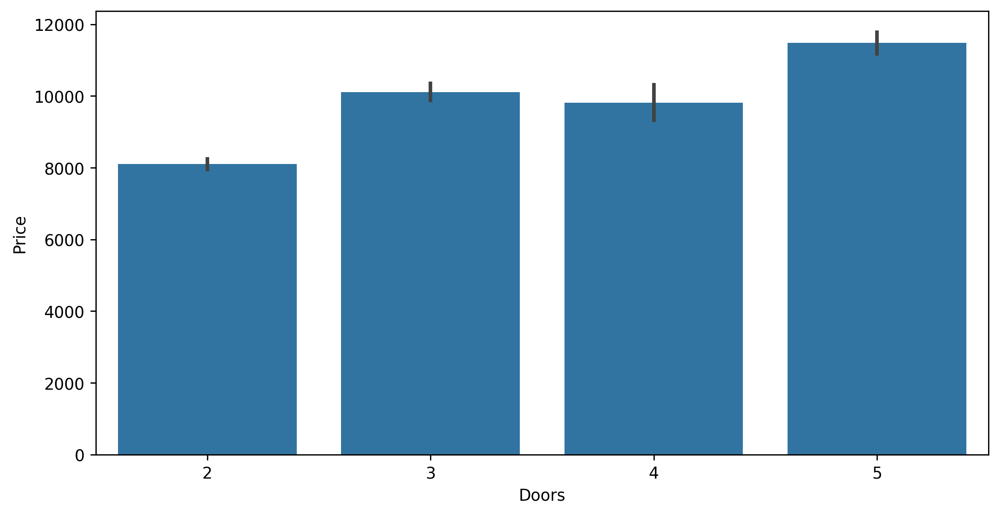

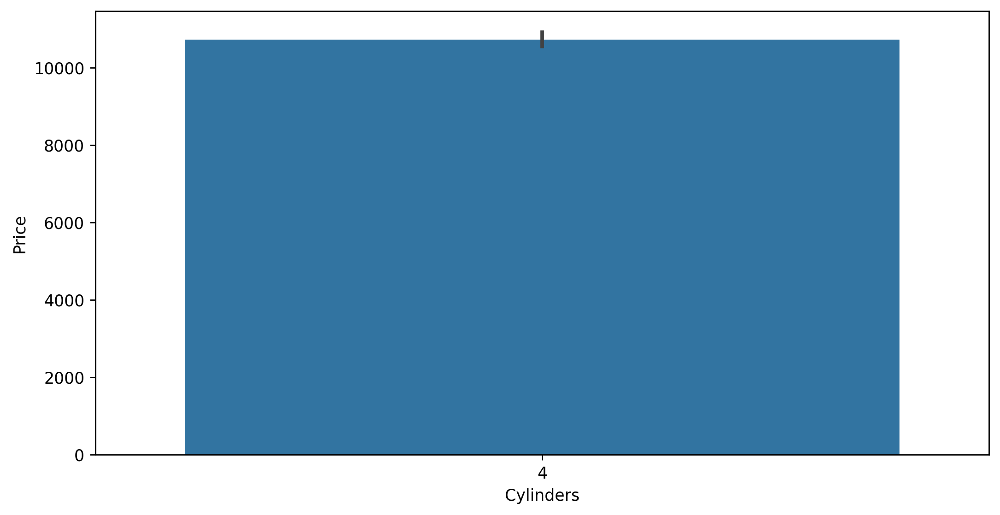

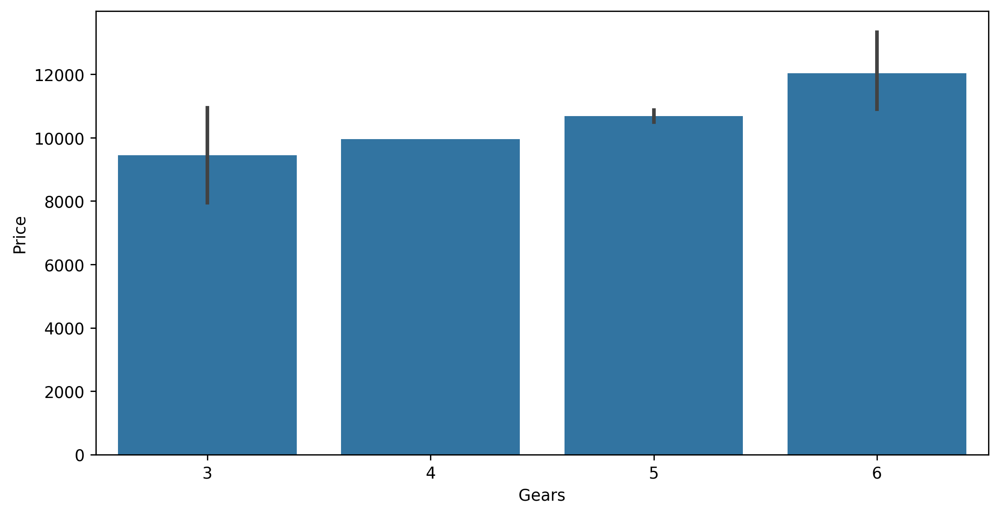

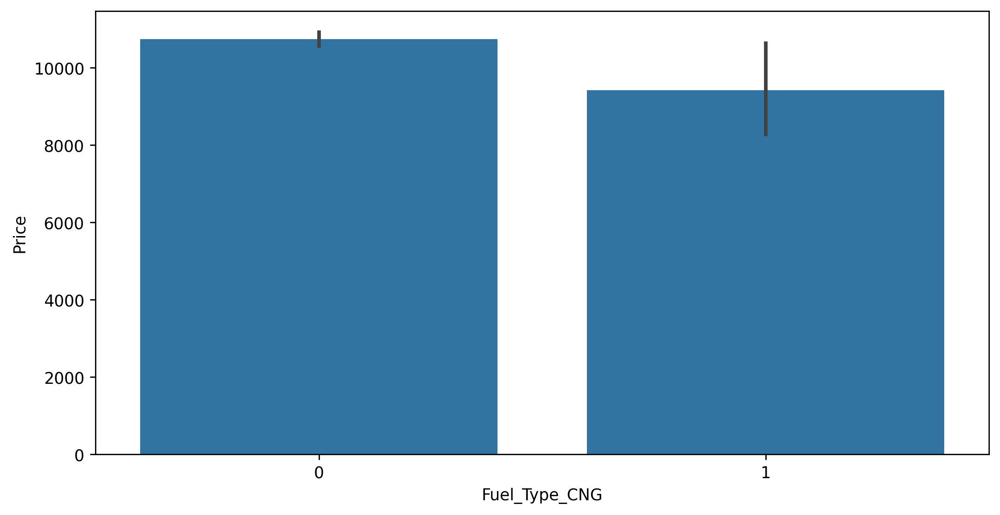

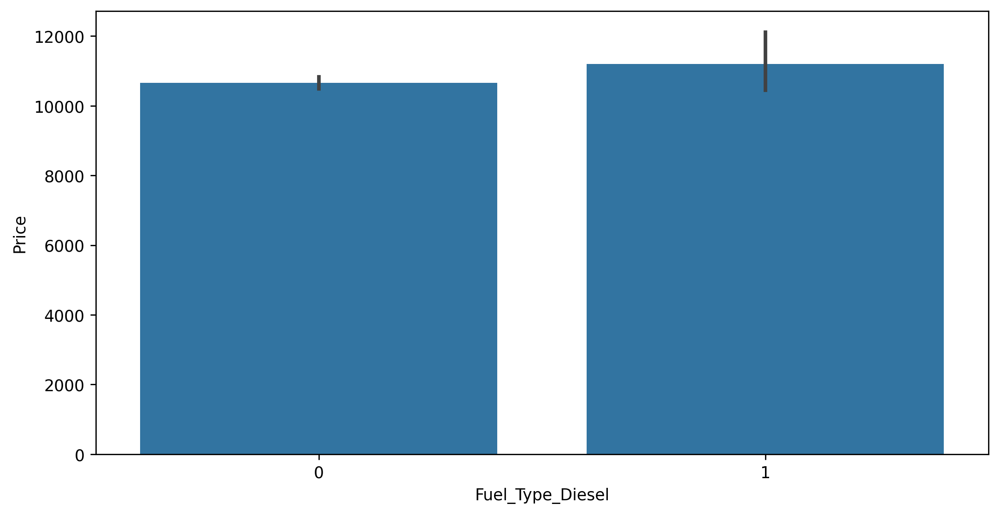

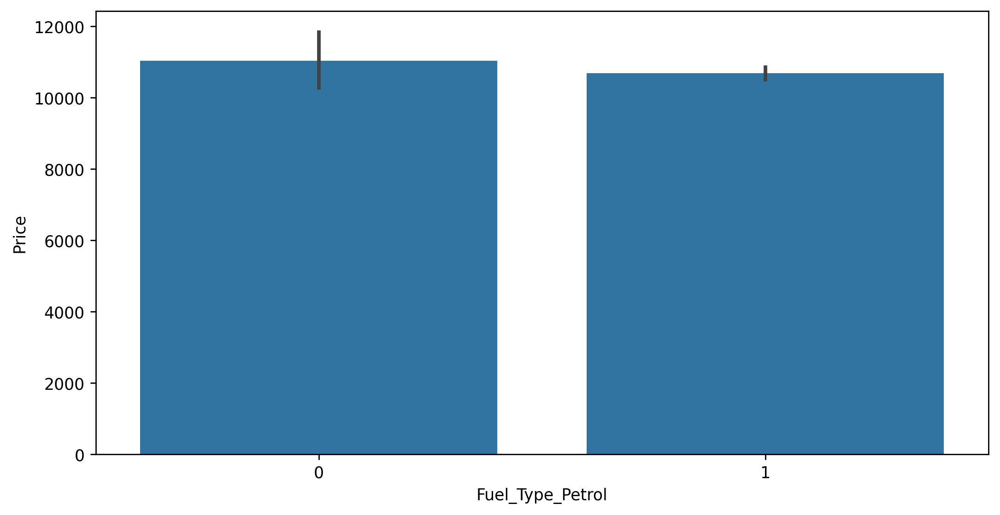

In [26]:
#Visualizing discrete features
for i in df_dis.columns:
    plt.figure()
    sns.barplot(data=df,x=i,y='Price')
plt.show()


<Axes: >

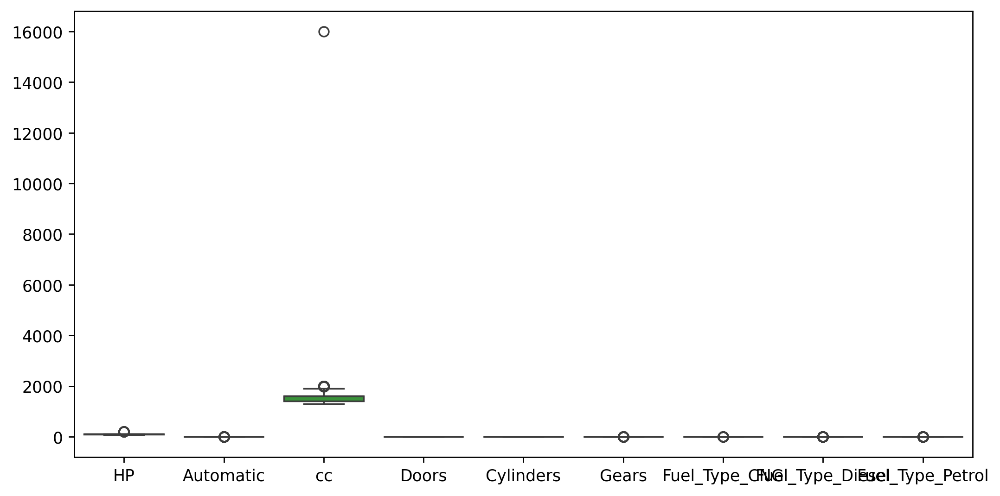

In [27]:
sns.boxplot(df_dis)

In [28]:
co_rel = pd.concat([df_dis,df['Price']],axis=1)
co_rel
co_rel.corr()

,HP,Automatic,cc,Doors,Cylinders,Gears,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol,Price
HP,1.000000,0.013313,0.035207,0.091803,NaN,0.209642,0.062203,-0.537116,0.492362,0.314134
Automatic,0.013313,1.000000,0.066934,-0.027492,NaN,-0.098582,0.001467,-0.084248,0.079997,0.033928
cc,0.035207,0.066934,1.000000,0.079254,NaN,0.014732,0.006019,0.326780,-0.314200,0.124375
Doors,0.091803,-0.027492,0.079254,1.000000,NaN,-0.160101,0.009761,0.023538,-0.025746,0.183604
Cylinders,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gears,0.209642,-0.098582,0.014732,-0.160101,NaN,1.000000,-0.049548,-0.048706,0.063079,0.063831
Fuel_Type_CNG,0.062203,0.001467,0.006019,0.009761,NaN,-0.049548,1.000000,-0.037964,-0.297688,-0.039449
Fuel_Type_Diesel,-0.537116,-0.084248,0.326780,0.023538,NaN,-0.048706,-0.037964,1.000000,-0.942673,0.046612
Fuel_Type_Petrol,0.492362,0.079997,-0.314200,-0.025746,NaN,0.063079,-0.297688,-0.942673,1.000000,-0.031356
Price,0.314134,0.033928,0.124375,0.183604,NaN,0.063831,-0.039449,0.046612,-0.031356,1.000000


<Axes: >

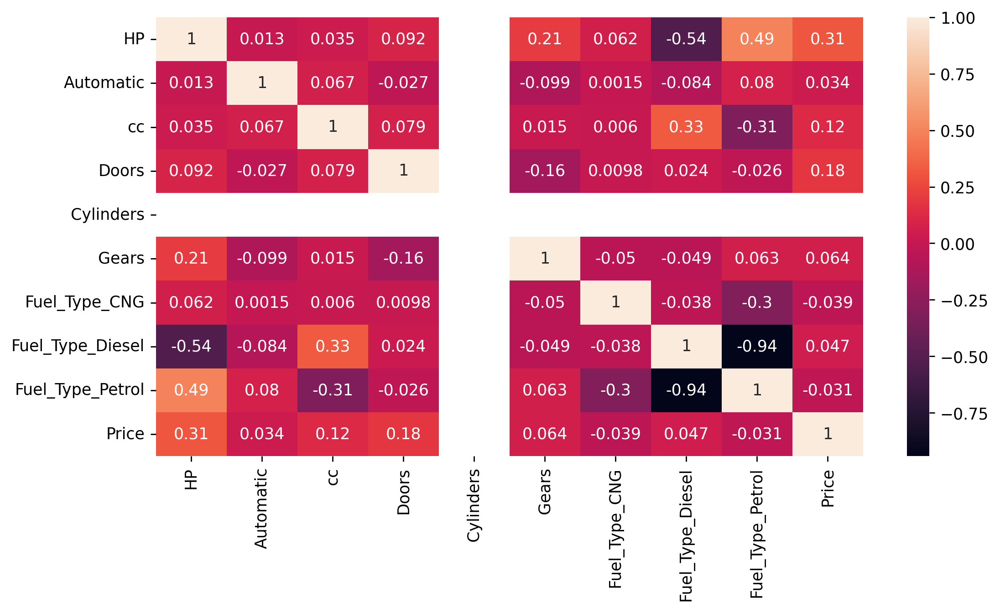

In [29]:
sns.heatmap(co_rel.corr(),annot=True)

## Model Building

In [30]:
df.columns

Index(['Price', 'Age', 'KM', 'HP', 'Automatic', 'cc', 'Doors', 'Cylinders',
       'Gears', 'Weight', 'Fuel_Type_CNG', 'Fuel_Type_Diesel',
       'Fuel_Type_Petrol'],
      dtype='object')

In [31]:
model=smf.ols("Price~Age+KM+Weight",data=df_cont).fit()

In [32]:
pred=model.predict(df)
pred

0       17008.950179
1       16383.174959
2       17015.881507
3       16623.693184
4       16468.827396
            ...     
1430     9394.625074
1431     8876.794810
1432     9044.904996
1433     9167.584929
1434    10776.993285
Length: 1435, dtype: float64

In [33]:
model.params

Intercept   -1722.709518
Age          -120.268560
KM             -0.024114
Weight         19.425617
dtype: float64

In [34]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.847
Model:                            OLS   Adj. R-squared:                  0.846
Method:                 Least Squares   F-statistic:                     2635.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        18:46:01   Log-Likelihood:                -12444.
No. Observations:                1435   AIC:                         2.490e+04
Df Residuals:                    1431   BIC:                         2.492e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1722.7095    967.073     -1.781      0.075   -3619.743     174.324
Age         -120.2686      2.741    -43.881      0.000    -125.645    -114.892
KM            -0.0241      0.001    -20.083      0.000      -0.026      -0.022
Weight        19.4256      0.841     23.101      0.000      17.776      21.075
==============================================================================
Omnibus:                      216.390   Durbin-Watson:                   1.524
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2156.068
Skew:                          -0.352   Prob(JB):                         0.00
Kurtosis:                       8.964   Cond. No.                     2.02e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.02e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Model Diagnostics

In [35]:
# Error values

model.resid

0      -3508.950179
1      -2633.174959
2      -3065.881507
3      -1673.693184
4      -2718.827396
           ...     
1430   -1894.625074
1431    1968.205190
1432    -544.904996
1433   -1917.584929
1434   -3826.993285
Length: 1435, dtype: float64

In [36]:
model.resid_pearson

array([-2.48115129, -1.86189746, -2.16786089, ..., -0.38529807,
       -1.35590934, -2.70603709])

## Evaluation

In [37]:
# Root Mean Square Error(RMSE)

rmse = np.sqrt(model.mse_resid)
rmse

1414.2427333201688

In [38]:
#Treating the Outlier
#Using Interquartile range method
#Price feature
Q1 = np.quantile(df_cont.Price,0.25)
Q3 = np.quantile(df_cont.Price,0.75)
IQR = Q3 - Q1
upper_fence = Q3+(1.5*IQR)
lower_fence = Q1-(1.5*IQR)
print('First Quartile=', Q1,'\n' 'Third Quartile=', Q3,'\n'
      'Inter-Quartile Range=', IQR,'\n' 'Upper fence =', upper_fence,'\n' 'Lower fence=', lower_fence)

First Quartile= 8450.0 
Third Quartile= 11950.0 
Inter-Quartile Range= 3500.0 
Upper fence = 17200.0 
Lower fence= 3200.0


In [39]:
df_cont[(df_cont.Price <= lower_fence) | (df_cont.Price >= upper_fence)]

,Price,Age,KM,Weight
7,18600,30,75889,1245
8,21500,27,19700,1185
10,20950,25,31461,1185
11,19950,22,43610,1185
12,19600,25,32189,1185
...,...,...,...,...
181,21125,2,225,1110
182,21500,2,15,1130
183,17795,1,1,1100
184,18245,1,1,1075


In [40]:
# Mean imputation
# Replace the outlier value with the mean of the column
df_cont1 = df_cont.copy()
for i in df_cont1['Price']:
    Q1 = np.quantile(df_cont1.Price,0.25)
    Q3 = np.quantile(df_cont1.Price,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont1['Price']=df_cont1['Price'].replace(i,np.mean(df_cont1['Price']))
df_cont1

,Price,Age,KM,Weight
0,13500.000000,23,46986,1165
1,13750.000000,23,72937,1165
2,13950.000000,24,41711,1165
3,10238.651011,26,48000,1165
4,13750.000000,30,38500,1170
...,...,...,...,...
1430,7500.000000,69,20544,1025
1431,10845.000000,72,19000,1015
1432,8500.000000,71,17016,1015
1433,7250.000000,70,16916,1015


{'whiskers': [<matplotlib.lines.Line2D at 0x1bcec1ccad0>,
 'caps': [<matplotlib.lines.Line2D at 0x1bcec1cd100>,
 'boxes': [<matplotlib.lines.Line2D at 0x1bcec1cc920>],
 'medians': [<matplotlib.lines.Line2D at 0x1bcec1cd4f0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1bcec1cd790>],
 'means': []}

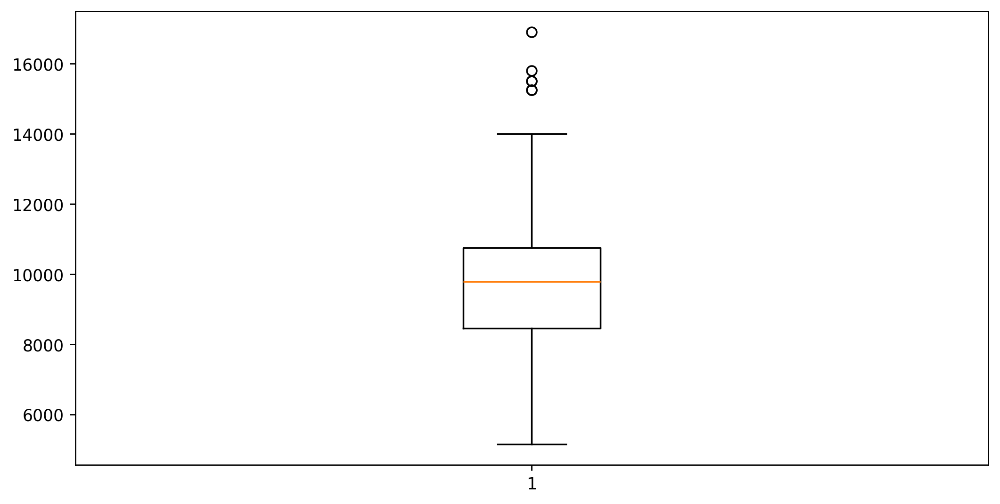

In [41]:
plt.boxplot(df_cont1['Price'])

In [42]:
#b.) Median Imputation method

# Replace the outlier value with the median of the column
df_cont2 = df_cont.copy()
for i in df_cont2['Price']:
    Q1 = np.quantile(df_cont2.Price,0.25)
    Q3 = np.quantile(df_cont2.Price,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont2['Price']=df_cont2['Price'].replace(i,np.median(df_cont2['Price']))
df_cont2


,Price,Age,KM,Weight
0,13500,23,46986,1165
1,13750,23,72937,1165
2,13950,24,41711,1165
3,9900,26,48000,1165
4,13750,30,38500,1170
...,...,...,...,...
1430,7500,69,20544,1025
1431,10845,72,19000,1015
1432,8500,71,17016,1015
1433,7250,70,16916,1015


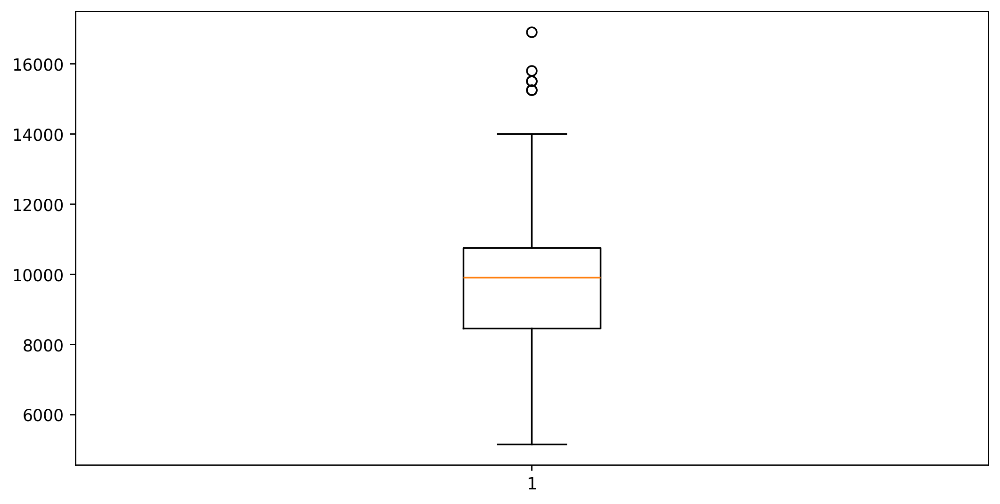

In [43]:
plt.boxplot(df_cont2['Price'])
plt.show()

In [44]:
# Remove entire observation containing the outlier
df_cont3=df_cont.copy()
for i in df_cont3['Price']:
    Q1 = np.quantile(df_cont3.Price,0.25)
    Q3 = np.quantile(df_cont3.Price,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont3.drop(df_cont3[df_cont3['Price']==i].index,inplace=True)
df_cont3.shape

(1282, 4)

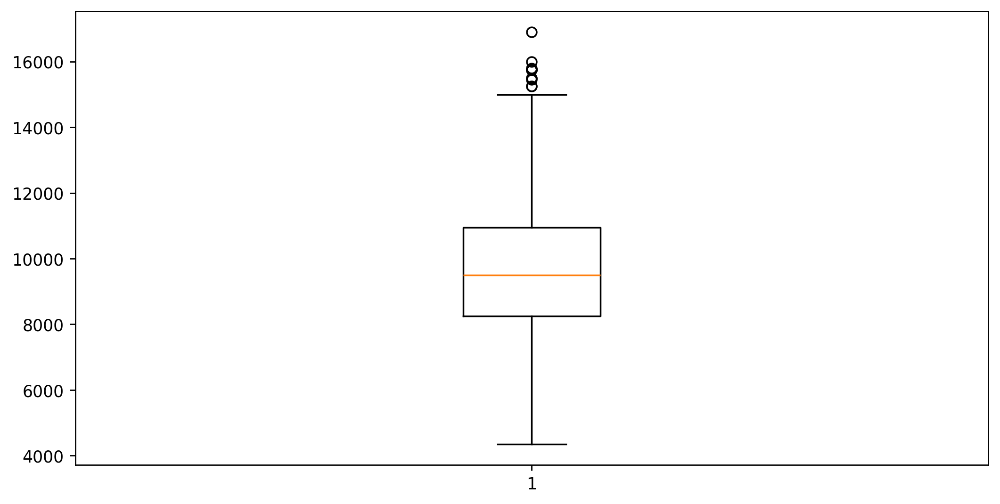

In [45]:
plt.boxplot(df_cont3['Price'])
plt.show()

In [46]:
Q1 = np.quantile(df_cont.Age,0.25)
Q3 = np.quantile(df_cont.Age,0.75)
IQR = Q3 - Q1
upper_fence = Q3+(1.5*IQR)
lower_fence = Q1-(1.5*IQR)
print('First Quartile=', Q1,'\n' 'Third Quartile=', Q3,'\n'
      'Inter-Quartile Range=', IQR,'\n' 'Upper fence =', upper_fence,'\n' 'Lower fence=', lower_fence)

First Quartile= 44.0 
Third Quartile= 70.0 
Inter-Quartile Range= 26.0 
Upper fence = 109.0 
Lower fence= 5.0


In [47]:
df_cont[(df_cont.Age <= lower_fence) | (df_cont.Age >= upper_fence)]


,Price,Age,KM,Weight
109,32500,4,1,1480
110,31000,4,4000,1480
111,31275,4,1500,1480
181,21125,2,225,1110
182,21500,2,15,1130
183,17795,1,1,1100
184,18245,1,1,1075


In [48]:
# Mean imputation
# Replace the outlier value with the mean of the column
for i in df_cont1['Age']:
    Q1 = np.quantile(df_cont1.Age,0.25)
    Q3 = np.quantile(df_cont1.Age,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont1['Age']=df_cont1['Age'].replace(i,np.mean(df_cont1['Age']))
df_cont1

,Price,Age,KM,Weight
0,13500.000000,23.0,46986,1165
1,13750.000000,23.0,72937,1165
2,13950.000000,24.0,41711,1165
3,10238.651011,26.0,48000,1165
4,13750.000000,30.0,38500,1170
...,...,...,...,...
1430,7500.000000,69.0,20544,1025
1431,10845.000000,72.0,19000,1015
1432,8500.000000,71.0,17016,1015
1433,7250.000000,70.0,16916,1015


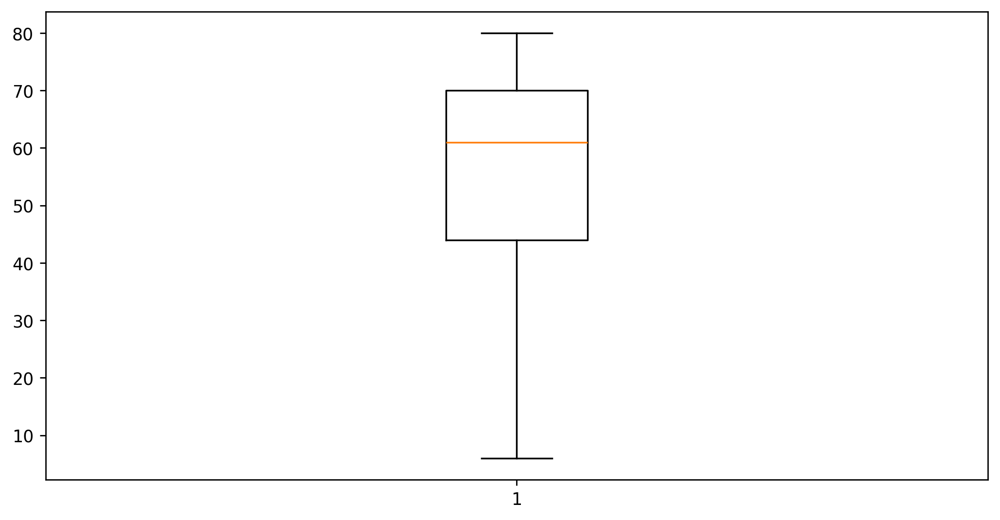

In [49]:
plt.boxplot(df_cont1['Age'])
plt.show()

In [50]:
# Median imputation
# Replace the outlier value with the median of the column
for i in df_cont2['Age']:
    Q1 = np.quantile(df_cont2.Age,0.25)
    Q3 = np.quantile(df_cont2.Age,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont2['Age']=df_cont2['Age'].replace(i,np.median(df_cont2['Age']))
df_cont2

,Price,Age,KM,Weight
0,13500,23,46986,1165
1,13750,23,72937,1165
2,13950,24,41711,1165
3,9900,26,48000,1165
4,13750,30,38500,1170
...,...,...,...,...
1430,7500,69,20544,1025
1431,10845,72,19000,1015
1432,8500,71,17016,1015
1433,7250,70,16916,1015


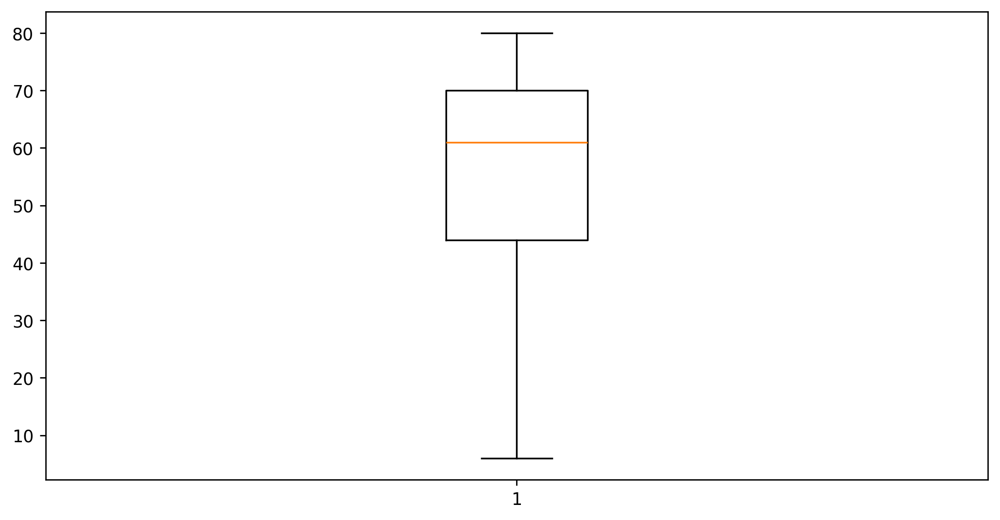

In [51]:
plt.boxplot(df_cont2['Age'])
plt.show()

In [52]:
# Remove entire observation containing the outlier
for i in df_cont3['Age']:
    Q1 = np.quantile(df_cont3.Age,0.25)
    Q3 = np.quantile(df_cont3.Age,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont3.drop(df_cont3[df_cont3['Age']==i].index,inplace=True)
df_cont3.shape

(1282, 4)

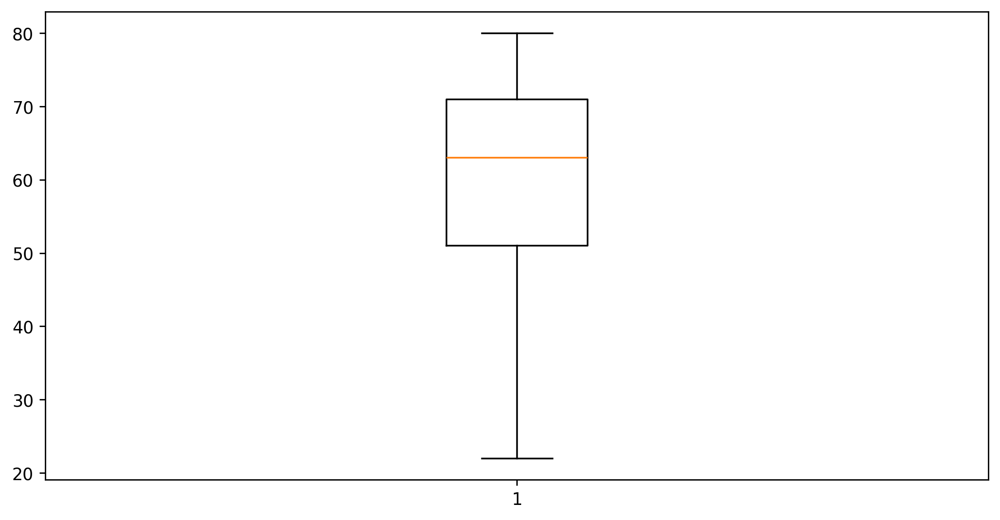

In [53]:
plt.boxplot(df_cont3['Age'])
plt.show()

In [54]:
Q1 = np.quantile(df_cont.KM,0.25)
Q3 = np.quantile(df_cont.KM,0.75)
IQR = Q3 - Q1
upper_fence = Q3+(1.5*IQR)
lower_fence = Q1-(1.5*IQR)
print('First Quartile=', Q1,'\n' 'Third Quartile=', Q3,'\n'
      'Inter-Quartile Range=', IQR,'\n' 'Upper fence =', upper_fence,'\n' 'Lower fence=', lower_fence)


First Quartile= 43000.0 
Third Quartile= 87041.5 
Inter-Quartile Range= 44041.5 
Upper fence = 153103.75 
Lower fence= -23062.25


In [55]:
df_cont[(df_cont.KM <= lower_fence) | (df_cont.KM >= upper_fence)]


,Price,Age,KM,Weight
185,6950,43,243000,1110
186,9500,38,180638,1160
187,11950,40,179860,1205
188,7750,43,178858,1084
189,11950,40,161000,1105
190,4350,44,158320,1110
377,6500,53,216000,1110
378,6400,51,198167,1095
379,7000,53,176000,1105
380,7750,54,174139,1100


In [56]:
# Mean imputation
# Replace the outlier value with the mean of the column
for i in df_cont1['KM']:
    Q1 = np.quantile(df_cont1.KM,0.25)
    Q3 = np.quantile(df_cont1.KM,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont1['KM']=df_cont1['KM'].replace(i,np.mean(df_cont1['KM']))
df_cont1

,Price,Age,KM,Weight
0,13500.000000,23.0,46986.0,1165
1,13750.000000,23.0,72937.0,1165
2,13950.000000,24.0,41711.0,1165
3,10238.651011,26.0,48000.0,1165
4,13750.000000,30.0,38500.0,1170
...,...,...,...,...
1430,7500.000000,69.0,20544.0,1025
1431,10845.000000,72.0,19000.0,1015
1432,8500.000000,71.0,17016.0,1015
1433,7250.000000,70.0,16916.0,1015


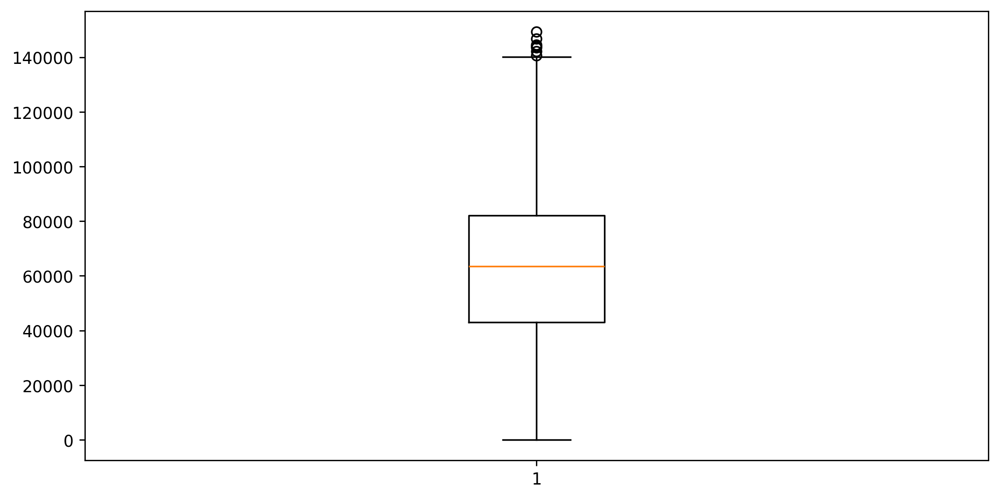

In [57]:
plt.boxplot(df_cont1['KM'])
plt.show()

In [58]:
# Median imputation
# Replace the outlier value with the median of the column
for i in df_cont2['KM']:
    Q1 = np.quantile(df_cont2.KM,0.25)
    Q3 = np.quantile(df_cont2.KM,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont2['Run_KM']=df_cont2['KM'].replace(i,np.median(df_cont2['KM']))
df_cont2

,Price,Age,KM,Weight,Run_KM
0,13500,23,46986,1165,46986
1,13750,23,72937,1165,72937
2,13950,24,41711,1165,41711
3,9900,26,48000,1165,48000
4,13750,30,38500,1170,38500
...,...,...,...,...,...
1430,7500,69,20544,1025,20544
1431,10845,72,19000,1015,19000
1432,8500,71,17016,1015,17016
1433,7250,70,16916,1015,16916


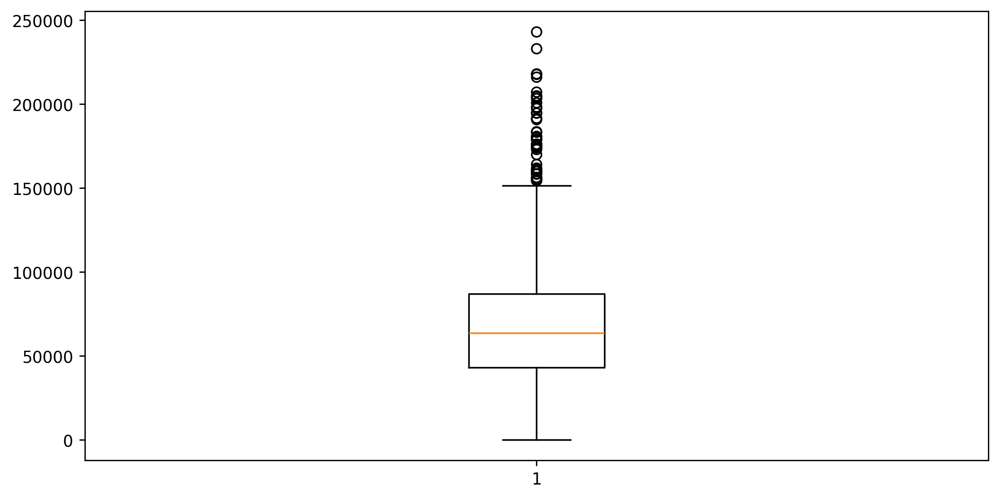

In [59]:
plt.boxplot(df_cont2['KM'])
plt.show()

In [60]:
# Remove entire observation containing the outlier
for i in df_cont3['KM']:
    Q1 = np.quantile(df_cont3.KM,0.25)
    Q3 = np.quantile(df_cont3.KM,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont3.drop(df_cont3[df_cont3['KM']==i].index,inplace=True)
df_cont3.shape

(1225, 4)

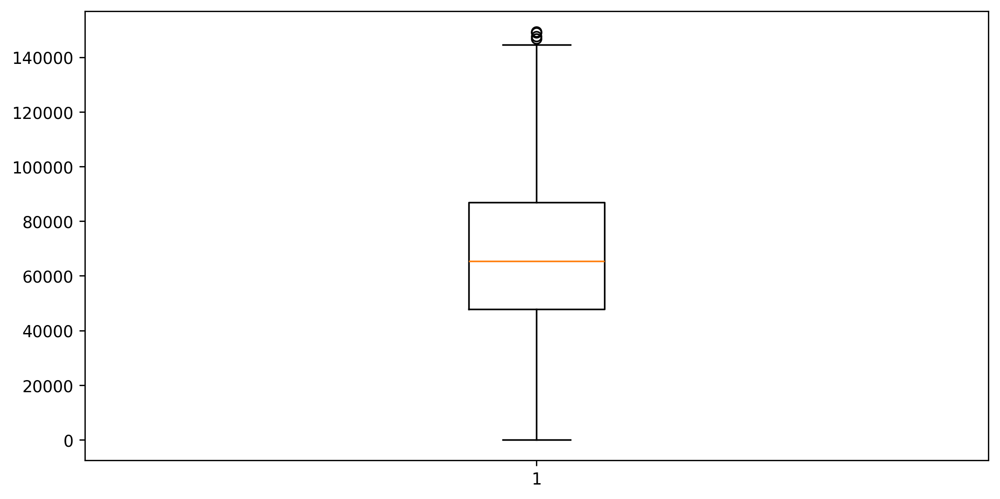

In [61]:
plt.boxplot(df_cont3['KM'])
plt.show()

In [62]:
Q1 = np.quantile(df_cont.Weight,0.25)
Q3 = np.quantile(df_cont.Weight,0.75)
IQR = Q3 - Q1
upper_fence = Q3+(1.5*IQR)
lower_fence = Q1-(1.5*IQR)
print('First Quartile=', Q1,'\n' 'Third Quartile=', Q3,'\n'
      'Inter-Quartile Range=', IQR,'\n' 'Upper fence =', upper_fence,'\n' 'Lower fence=', lower_fence)

First Quartile= 1040.0 
Third Quartile= 1085.0 
Inter-Quartile Range= 45.0 
Upper fence = 1152.5 
Lower fence= 972.5


In [63]:
df_cont[(df_cont.Weight <= lower_fence) | (df_cont.Weight >= upper_fence)]


,Price,Age,KM,Weight
0,13500,23,46986,1165
1,13750,23,72937,1165
2,13950,24,41711,1165
3,14950,26,48000,1165
4,13750,30,38500,1170
...,...,...,...,...
600,7500,50,1,1260
653,6950,65,114383,1260
767,10950,59,78750,1155
959,9390,66,50806,1480


In [64]:
# Mean imputation
# Replace the outlier value with the mean of the column
for i in df_cont1['Weight']:
    Q1 = np.quantile(df_cont1.Weight,0.25)
    Q3 = np.quantile(df_cont1.Weight,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont1['Weight']=df_cont1['Weight'].replace(i,np.mean(df_cont1['Weight']))
df_cont1

,Price,Age,KM,Weight
0,13500.000000,23.0,46986.0,1072.287108
1,13750.000000,23.0,72937.0,1072.287108
2,13950.000000,24.0,41711.0,1072.287108
3,10238.651011,26.0,48000.0,1072.287108
4,13750.000000,30.0,38500.0,1071.770242
...,...,...,...,...
1430,7500.000000,69.0,20544.0,1025.000000
1431,10845.000000,72.0,19000.0,1015.000000
1432,8500.000000,71.0,17016.0,1015.000000
1433,7250.000000,70.0,16916.0,1015.000000


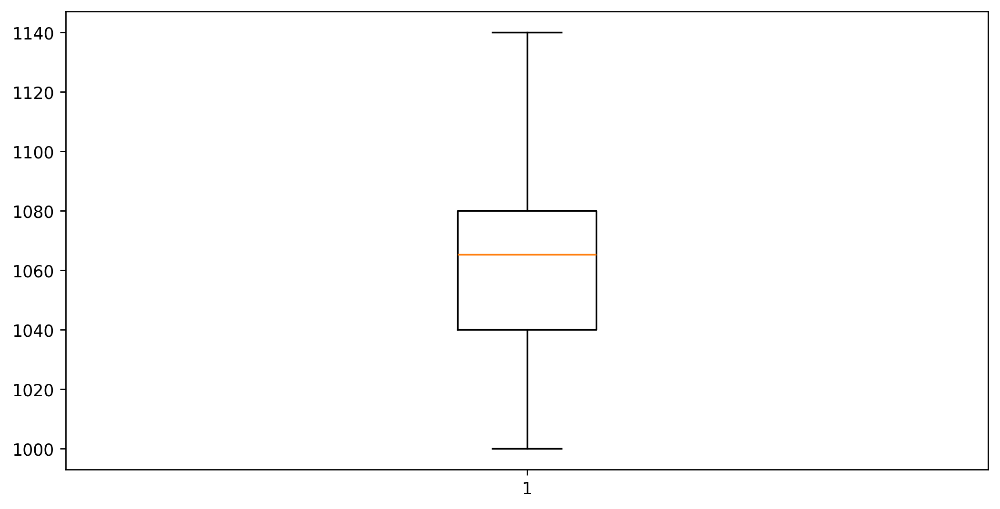

In [65]:
plt.boxplot(df_cont1['Weight'])
plt.show()

In [66]:
# Replace the outlier value with the median of the column
for i in df_cont2['Weight']:
    Q1 = np.quantile(df_cont2.Weight,0.25)
    Q3 = np.quantile(df_cont2.Weight,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont2['Weight']=df_cont2['Weight'].replace(i,np.median(df_cont2['Weight']))
df_cont2

,Price,Age,KM,Weight,Run_KM
0,13500,23,46986,1070,46986
1,13750,23,72937,1070,72937
2,13950,24,41711,1070,41711
3,9900,26,48000,1070,48000
4,13750,30,38500,1070,38500
...,...,...,...,...,...
1430,7500,69,20544,1025,20544
1431,10845,72,19000,1015,19000
1432,8500,71,17016,1015,17016
1433,7250,70,16916,1015,16916


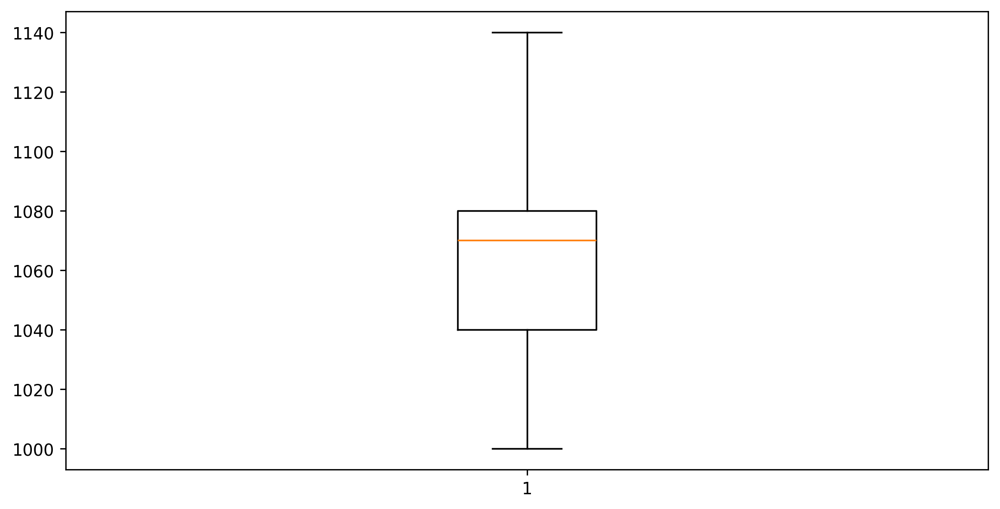

In [67]:
plt.boxplot(df_cont2['Weight'])
plt.show()

In [68]:
# Remove entire observation containing the outlier
for i in df_cont3['Weight']:
    Q1 = np.quantile(df_cont3.Weight,0.25)
    Q3 = np.quantile(df_cont3.Weight,0.75)
    IQR = Q3 - Q1
    upper_fence = Q3+(1.5*IQR)
    lower_fence = Q1-(1.5*IQR)
    if i > upper_fence or i < lower_fence:
        df_cont3.drop(df_cont3[df_cont3['Weight']==i].index,inplace=True)
df_cont3.shape

(1190, 4)

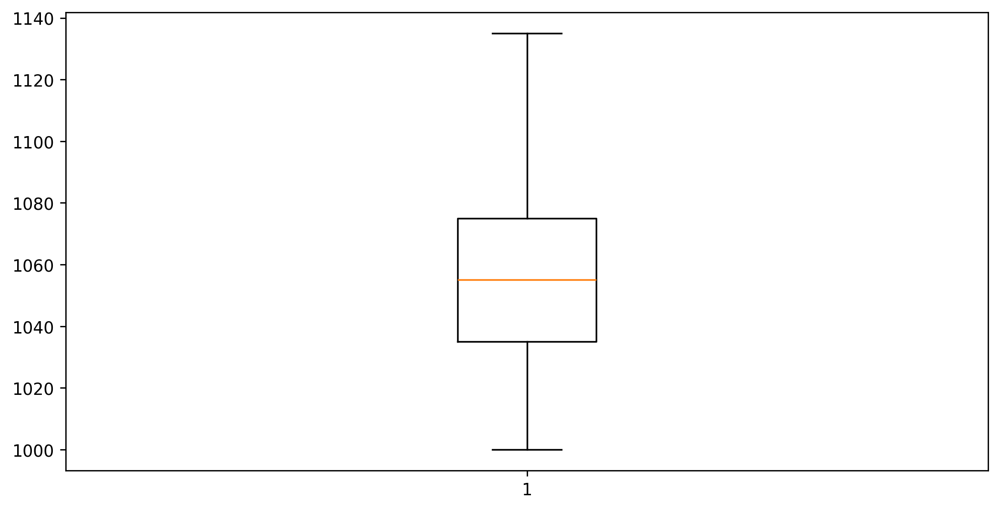

In [69]:
plt.boxplot(df_cont3['Weight'])
plt.show()

##### Model after applying Mean imputation method

In [70]:
model_1 = smf.ols("Price~Age+KM+Weight",data=df_cont1).fit()
pred_1 = model_1.predict(df_cont1)
pred_1

0       11681.323118
1       11538.662568
2       11653.198272
3       11504.379470
4       11328.716376
            ...     
1430     9254.371308
1431     9103.195347
1432     9171.225126
1433     9228.897984
1434     8863.260860
Length: 1435, dtype: float64

In [71]:
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.388
Model:                            OLS   Adj. R-squared:                  0.387
Method:                 Least Squares   F-statistic:                     302.4
Date:                Mon, 22 Jul 2024   Prob (F-statistic):          5.18e-152
Time:                        18:46:17   Log-Likelihood:                -12440.
No. Observations:                1435   AIC:                         2.489e+04
Df Residuals:                    1431   BIC:                         2.491e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.451e+04   1385.095     10.475      0.000    1.18e+04    1.72e+04
Age          -57.1231      2.638    -21.654      0.000     -62.298     -51.948
KM            -0.0055      0.001     -3.681      0.000      -0.008      -0.003
Weight        -1.1706      1.257     -0.931      0.352      -3.636       1.295
==============================================================================
Omnibus:                        8.486   Durbin-Watson:                   1.130
Prob(Omnibus):                  0.014   Jarque-Bera (JB):                8.593
Skew:                           0.181   Prob(JB):                       0.0136
Kurtosis:                       2.887   Cond. No.                     2.63e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.63e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [72]:
# Root Mean Square Error(RMSE)
rmse_1 = np.sqrt(model_1.mse_resid)
rmse_1

1410.0019666187677

The R² value is decreased and the RMSE value increased.

Apply all other transformations and select the model with best R² value and low RMSE

#### Model after applying Median imputation method

In [73]:
model_2 = smf.ols("Price~Age+KM+Weight",data=df_cont2).fit()
pred_2 = model_2.predict(df_cont2)
pred_2

0       11412.532615
1       11133.971039
2       11423.516107
3       11264.730968
4       11184.148955
            ...     
1430     9560.083300
1431     9431.543177
1432     9498.478781
1433     9545.191272
1434     9534.069057
Length: 1435, dtype: float64

In [74]:
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.372
Model:                            OLS   Adj. R-squared:                  0.371
Method:                 Least Squares   F-statistic:                     283.0
Date:                Mon, 22 Jul 2024   Prob (F-statistic):          3.30e-144
Time:                        18:46:18   Log-Likelihood:                -12449.
No. Observations:                1435   AIC:                         2.491e+04
Df Residuals:                    1431   BIC:                         2.493e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.209e+04   1431.555      8.445      0.000    9281.399    1.49e+04
Age          -45.6391      2.650    -17.225      0.000     -50.837     -40.442
KM            -0.0107      0.001     -8.963      0.000      -0.013      -0.008
Weight         0.8196      1.299      0.631      0.528      -1.729       3.368
==============================================================================
Omnibus:                       22.263   Durbin-Watson:                   1.088
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               22.988
Skew:                           0.302   Prob(JB):                     1.02e-05
Kurtosis:                       2.863   Cond. No.                     2.99e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.99e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [75]:
# Root Mean Square Error(RMSE)
rmse_2 = np.sqrt(model_2.mse_resid)
rmse_2

1418.61053688773

#### Model after removing outlier

In [76]:
model_3 = smf.ols("Price~Age+KM+Weight",data=df_cont3).fit()
pred_3 = model_3.predict(df_cont3)
pred_3

9       14025.041525
27      14124.027861
30      14427.183670
31      14682.051409
33      14329.296252
            ...     
1430     9375.805970
1431     8984.567853
1432     9117.685303
1433     9218.380806
1434    10112.388566
Length: 1190, dtype: float64

In [77]:
model_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.725
Model:                            OLS   Adj. R-squared:                  0.724
Method:                 Least Squares   F-statistic:                     1041.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        18:46:18   Log-Likelihood:                -9951.2
No. Observations:                1190   AIC:                         1.991e+04
Df Residuals:                    1186   BIC:                         1.993e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4167.8648   1193.059      3.493      0.000    1827.123    6508.607
Age          -98.9746      2.526    -39.181      0.000    -103.931     -94.018
KM            -0.0172      0.001    -14.234      0.000      -0.020      -0.015
Weight        12.0885      1.100     10.987      0.000       9.930      14.247
==============================================================================
Omnibus:                       93.202   Durbin-Watson:                   1.961
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              267.625
Skew:                          -0.391   Prob(JB):                     7.69e-59
Kurtosis:                       5.188   Cond. No.                     2.93e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.93e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [78]:
# Root Mean Square Error(RMSE)
rmse_3 = np.sqrt(model_3.mse_resid)
rmse_3

1038.0259523718778

Out of all the transformations, the model after removing the outlier has the best R² value and less RMSE value.

But this model performance is poor than the Raw data model

#### Check the significance of each indpendent variable

In [79]:
#Perform Simple linear regression on each variable and check the significance. If the P-value<0.05, then it is significant
#Check for Significance of Age feature

In [80]:
Slr_Age = smf.ols("Price~Age",data=df_cont).fit()
Slr_Age.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.768
Model:                            OLS   Adj. R-squared:                  0.768
Method:                 Least Squares   F-statistic:                     4740.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        18:46:18   Log-Likelihood:                -12742.
No. Observations:                1435   AIC:                         2.549e+04
Df Residuals:                    1433   BIC:                         2.550e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2.026e+04    145.926    138.818      0.000       2e+04    2.05e+04
Age         -170.3487      2.474    -68.847      0.000    -175.202    -165.495
==============================================================================
Omnibus:                      363.006   Durbin-Watson:                   1.223
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2878.814
Skew:                           0.951   Prob(JB):                         0.00
Kurtosis:                       9.673   Cond. No.                         187.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [81]:
#As the P-value<0.05, Age feature is significant to the model.

In [82]:
#Check for Significance of KM feature

In [83]:
Slr_Km = smf.ols("Price~KM",data=df_cont).fit()
Slr_Km.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.324
Model:                            OLS   Adj. R-squared:                  0.324
Method:                 Least Squares   F-statistic:                     687.6
Date:                Mon, 22 Jul 2024   Prob (F-statistic):          4.12e-124
Time:                        18:46:19   Log-Likelihood:                -13509.
No. Observations:                1435   AIC:                         2.702e+04
Df Residuals:                    1433   BIC:                         2.703e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.448e+04    163.344     88.643      0.000    1.42e+04    1.48e+04
KM            -0.0548      0.002    -26.222      0.000      -0.059      -0.051
==============================================================================
Omnibus:                      390.246   Durbin-Watson:                   0.389
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1119.937
Skew:                           1.385   Prob(JB):                    6.44e-244
Kurtosis:                       6.325   Cond. No.                     1.63e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.63e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [84]:
#As the P-value<0.05, Run feature is insignificant to the model.

In [85]:
#Check for Significance of Weight feature

In [86]:
Slr_Wt = smf.ols("Price~Weight",data=df_cont).fit()
Slr_Wt.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.332
Model:                            OLS   Adj. R-squared:                  0.331
Method:                 Least Squares   F-statistic:                     711.0
Date:                Mon, 22 Jul 2024   Prob (F-statistic):          1.55e-127
Time:                        18:46:19   Log-Likelihood:                -13501.
No. Observations:                1435   AIC:                         2.701e+04
Df Residuals:                    1433   BIC:                         2.702e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -3.193e+04   1601.273    -19.938      0.000   -3.51e+04   -2.88e+04
Weight        39.7719      1.492     26.665      0.000      36.846      42.698
==============================================================================
Omnibus:                      104.356   Durbin-Watson:                   0.558
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              513.888
Skew:                           0.046   Prob(JB):                    2.57e-112
Kurtosis:                       5.930   Cond. No.                     2.21e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.21e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [87]:
#As the P-value<0.05, Weight feature significant to the model.
#The features are independently significant.

##### Combination of features

In [88]:
arw_pr = smf.ols("Price~Age+KM+Weight",data=df_cont).fit()

In [89]:
arw_pr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.847
Model:                            OLS   Adj. R-squared:                  0.846
Method:                 Least Squares   F-statistic:                     2635.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        18:46:19   Log-Likelihood:                -12444.
No. Observations:                1435   AIC:                         2.490e+04
Df Residuals:                    1431   BIC:                         2.492e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1722.7095    967.073     -1.781      0.075   -3619.743     174.324
Age         -120.2686      2.741    -43.881      0.000    -125.645    -114.892
KM            -0.0241      0.001    -20.083      0.000      -0.026      -0.022
Weight        19.4256      0.841     23.101      0.000      17.776      21.075
==============================================================================
Omnibus:                      216.390   Durbin-Watson:                   1.524
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2156.068
Skew:                          -0.352   Prob(JB):                         0.00
Kurtosis:                       8.964   Cond. No.                     2.02e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.02e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [90]:
# Root Mean Square Error(RMSE)
rmse_arw_pr = np.sqrt(arw_pr.mse_resid)
rmse_arw_pr

1414.2427333201688

The above model is showing good R² value and both the variables are significant to the model, as the P-values are <0.05.
However check for multicollinearity by calculating Variance Inflation factor.

#### Calculate Variance Inflation Factor

In [91]:
rsq_a = smf.ols('Age~KM+Weight',data=df_cont).fit().rsquared
vif_a = 1/(1-rsq_a)
vif_a

1.8559235693401304

In [92]:
rsq_r = smf.ols('KM~Age+Weight',data=df_cont).fit().rsquared
vif_r = 1/(1-rsq_r)
vif_r

1.4528951340124632

In [93]:
rsq_w = smf.ols('Weight~Age+KM',data=df_cont).fit().rsquared
vif_w = 1/(1-rsq_w)
vif_w

1.3842090344564508

We have to remove the variable which is having the highest Variance Inflation factor(VIF). But here all the variables are having almost same VIF value.
So, Build models eliminating one variable in each model.

In [94]:
Age_Run = smf.ols("Price~Age+KM",data=df_cont).fit()

In [95]:
Age_Run.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     2687.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        18:46:20   Log-Likelihood:                -12672.
No. Observations:                1435   AIC:                         2.535e+04
Df Residuals:                    1432   BIC:                         2.536e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2.045e+04    139.846    146.207      0.000    2.02e+04    2.07e+04
Age         -153.6003      2.729    -56.276      0.000    -158.954    -148.246
KM            -0.0164      0.001    -12.161      0.000      -0.019      -0.014
==============================================================================
Omnibus:                      453.671   Durbin-Watson:                   1.302
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3455.391
Skew:                           1.259   Prob(JB):                         0.00
Kurtosis:                      10.173   Cond. No.                     2.50e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.5e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [96]:
# Root Mean Square Error(RMSE)
rmse_Age_Run = np.sqrt(Age_Run.mse_resid)
rmse_Age_Run

1656.5119695786614

In [97]:
Run_Wt = smf.ols("Price~KM+Weight",data=df_cont).fit()
Run_Wt.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.641
Model:                            OLS   Adj. R-squared:                  0.640
Method:                 Least Squares   F-statistic:                     1276.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):          7.40e-319
Time:                        18:46:20   Log-Likelihood:                -13056.
No. Observations:                1435   AIC:                         2.612e+04
Df Residuals:                    1432   BIC:                         2.613e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -2.727e+04   1182.234    -23.066      0.000   -2.96e+04    -2.5e+04
KM            -0.0535      0.002    -35.078      0.000      -0.057      -0.051
Weight        38.8517      1.095     35.495      0.000      36.705      40.999
==============================================================================
Omnibus:                      372.677   Durbin-Watson:                   0.959
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4828.633
Skew:                          -0.831   Prob(JB):                         0.00
Kurtosis:                      11.831   Cond. No.                     1.62e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.62e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [98]:
# Root Mean Square Error(RMSE)
rmse_Run_Wt = np.sqrt(Run_Wt.mse_resid)
rmse_Run_Wt

2165.20707705479

In [99]:
Wt_Age = smf.ols("Price~Weight+Age",data=df_cont).fit()
Wt_Age.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.804
Model:                            OLS   Adj. R-squared:                  0.803
Method:                 Least Squares   F-statistic:                     2929.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        18:46:21   Log-Likelihood:                -12622.
No. Observations:                1435   AIC:                         2.525e+04
Df Residuals:                    1432   BIC:                         2.527e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3356.0245   1056.440      3.177      0.002    1283.689    5428.360
Weight        14.7506      0.915     16.129      0.000      12.957      16.545
Age         -150.9804      2.574    -58.651      0.000    -156.030    -145.931
==============================================================================
Omnibus:                      149.410   Durbin-Watson:                   1.237
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              959.718
Skew:                          -0.228   Prob(JB):                    3.98e-209
Kurtosis:                       6.980   Cond. No.                     2.69e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.69e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [100]:
# Root Mean Square Error(RMSE)
rmse_Wt_Age = np.sqrt(Wt_Age.mse_resid)
rmse_Wt_Age

1600.6272826537731

### Final Results

In [101]:
results = {"MODEL":pd.Series(["Raw data","Mean Imputation model","Median Imputation model","After removing outlier","Comb. of Age and Run","Comb. of Run and Weight","Comb. of Weight and Age"]),
           "R²_Values":pd.Series([model.rsquared,model_1.rsquared,model_2.rsquared,model_3.rsquared,Age_Run.rsquared,Run_Wt.rsquared,Wt_Age.rsquared]),
           "RMSE_Values":pd.Series([rmse,rmse_1,rmse_2,rmse_3,rmse_Age_Run,rmse_Run_Wt,rmse_Wt_Age])
          }
result_table=pd.DataFrame(results)
result_table

,MODEL,R²_Values,RMSE_Values
0,Raw data,0.846740,1414.242733
1,Mean Imputation model,0.387962,1410.001967
2,Median Imputation model,0.372378,1418.610537
3,After removing outlier,0.724773,1038.025952
4,Comb. of Age and Run,0.789587,1656.511970
5,Comb. of Run and Weight,0.640513,2165.207077
6,Comb. of Weight and Age,0.803544,1600.627283


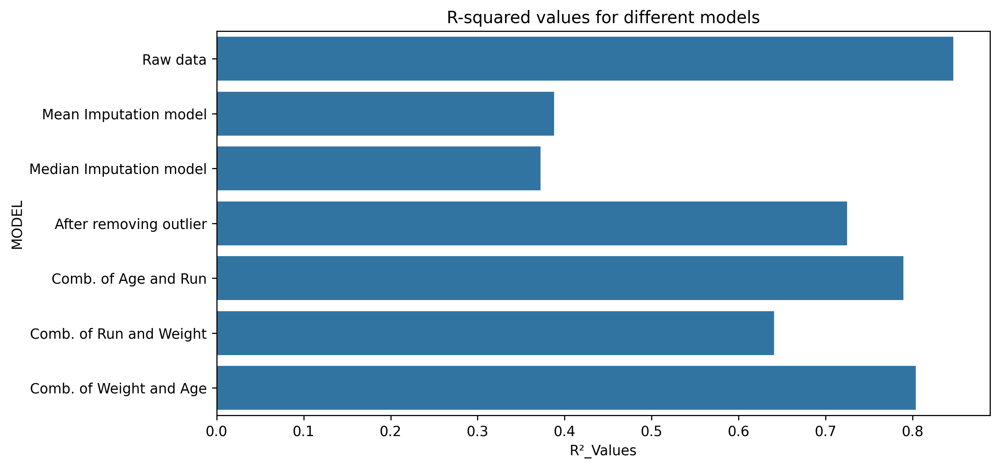

In [102]:
sns.barplot(x=result_table['R²_Values'],y=result_table['MODEL'])
plt.title("R-squared values for different models")
plt.show()

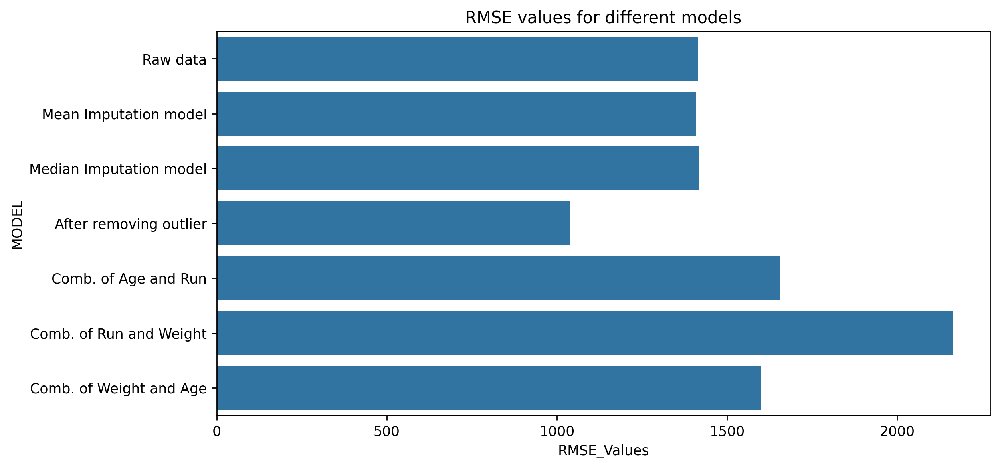

In [103]:
sns.barplot(x=result_table['RMSE_Values'],y=result_table['MODEL'])
plt.title("RMSE values for different models")
plt.show()

***From the above results, we can see that the model using Raw data gives the best R² value and less RMSE value***

***Hence this model can be selected as our final model and used for predicting the price. ***

### Residual Analysis

**Q-Q Plot**

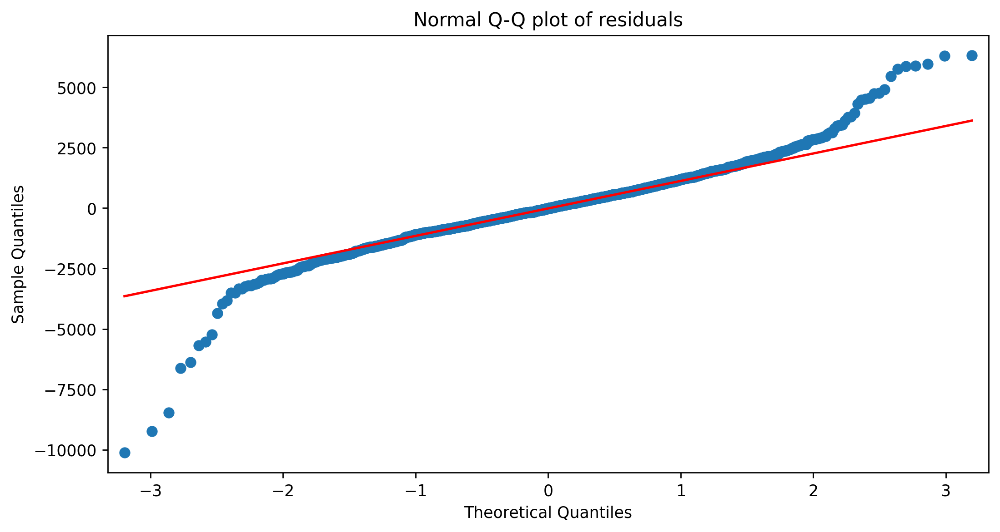

In [104]:
#Residuals values or errors
sm.qqplot(model.resid, line = 'q')
plt.title('Normal Q-Q plot of residuals')
plt.show()

In [105]:
#Test for Homoscedasticity
def get_standardized_values( vals ):
    return (vals - vals.mean())/vals.std()

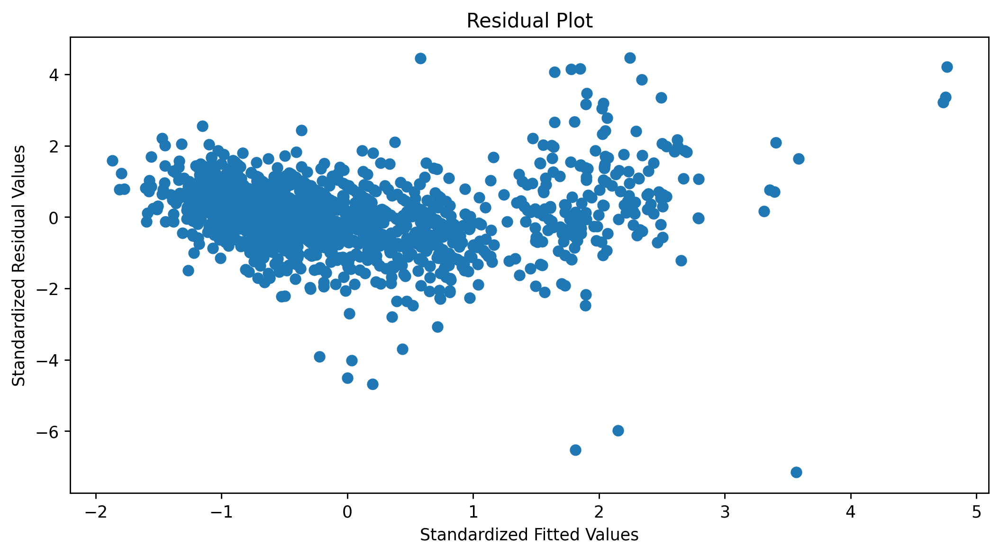

In [106]:
plt.scatter(get_standardized_values(model.fittedvalues), model.resid_pearson)
plt.title('Residual Plot')
plt.xlabel('Standardized Fitted Values')
plt.ylabel('Standardized Residual Values')
plt.show()

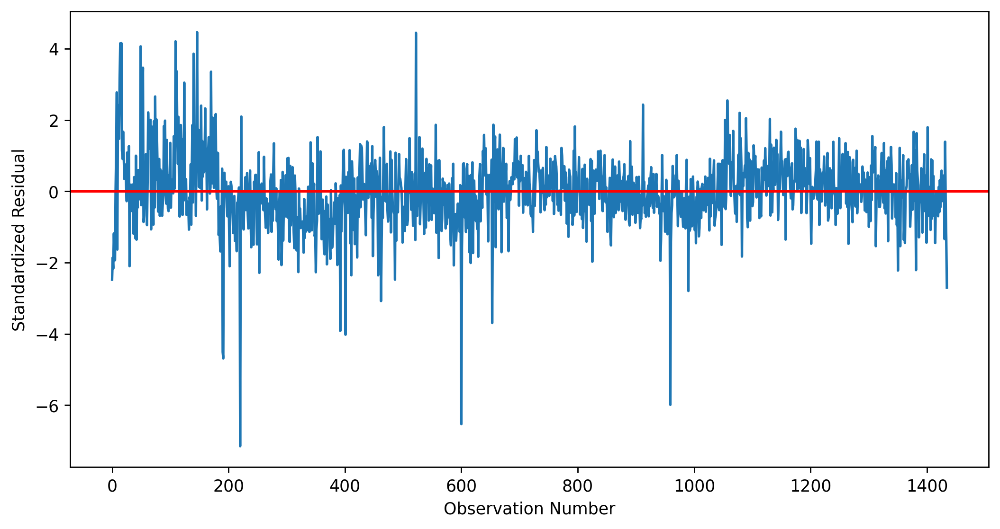

In [107]:
plt.plot(np.arange(len(df_cont)),model.resid_pearson)
plt.axhline(y=0,color='red')
plt.xlabel("Observation Number")
plt.ylabel("Standardized Residual")
plt.show()

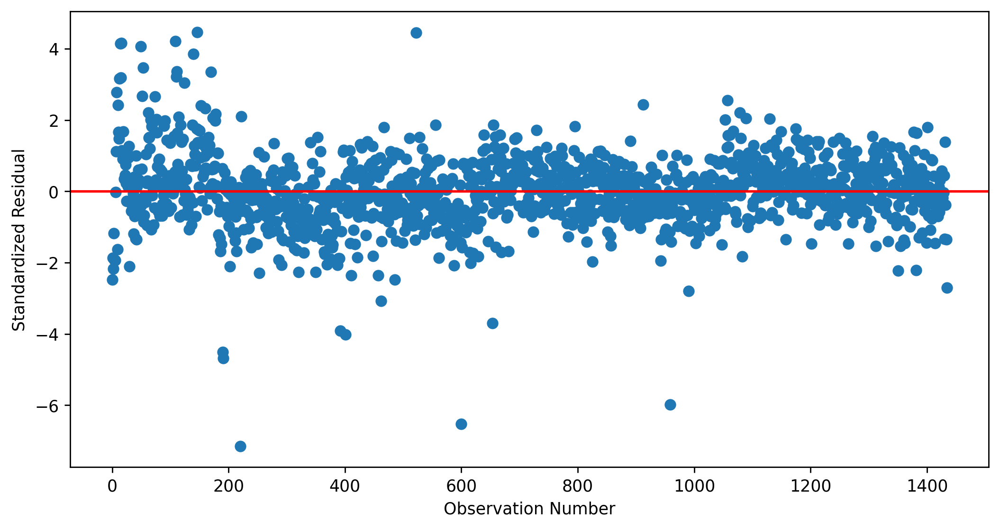

In [108]:
plt.scatter(np.arange(len(df_cont)),model.resid_pearson)
plt.axhline(y=0,color='red')
plt.xlabel("Observation Number")
plt.ylabel("Standardized Residual")
plt.show()

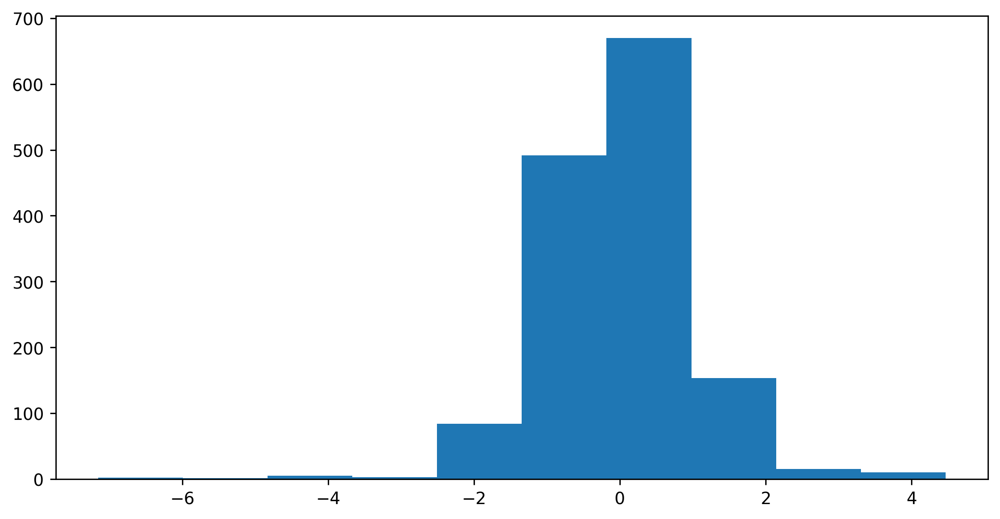

In [109]:
plt.hist(model.resid_pearson)
plt.show()

**Residual VS Regressors**

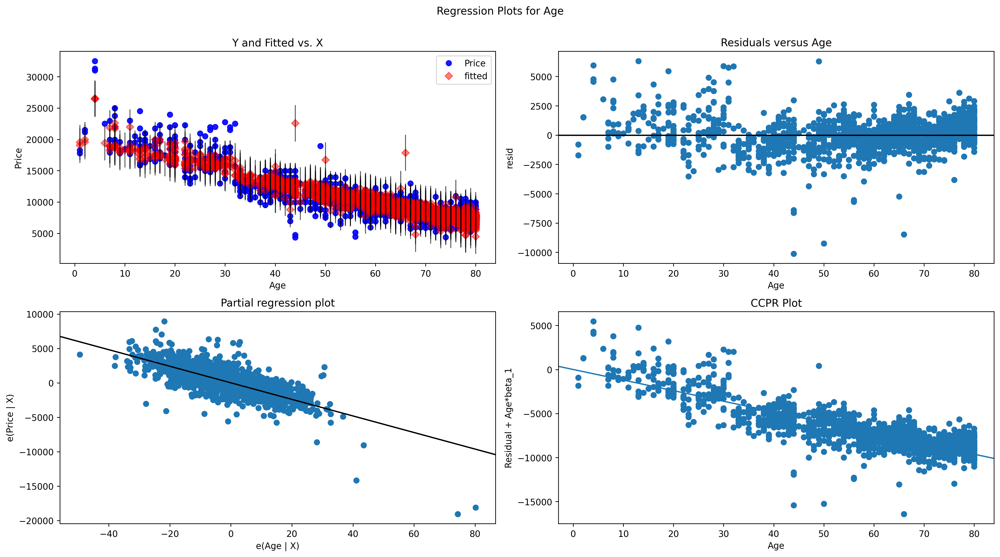

In [110]:
fig = plt.figure(figsize = (16,9))
plot_Age = sm.graphics.plot_regress_exog(model, 'Age', fig=fig)
plt.show()

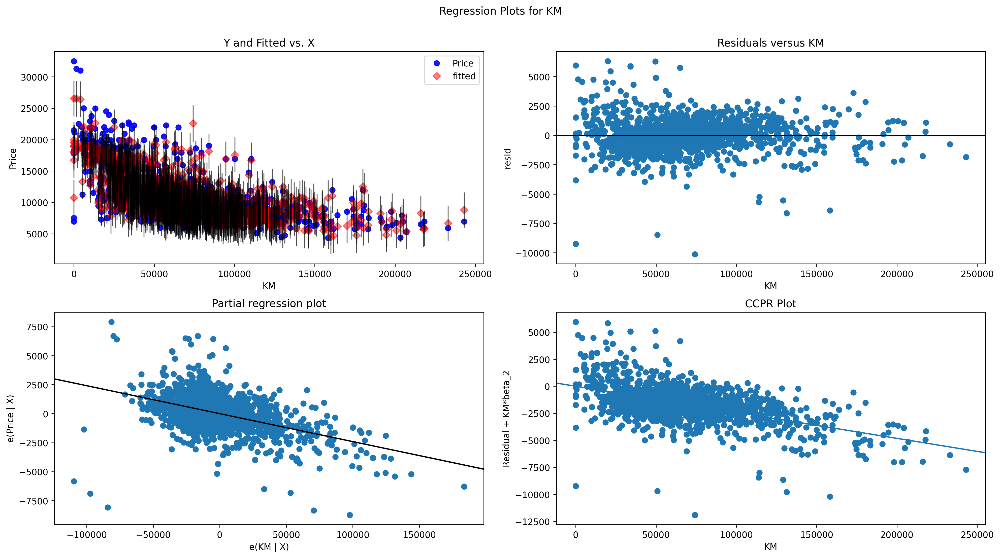

In [111]:
fig = plt.figure(figsize = (16,9))
plot_Run = sm.graphics.plot_regress_exog(model, 'KM', fig=fig)
plt.show()

### Detecting Influencers in the Model

In [112]:
#By using Cook's distance

influence_points=model.get_influence()
c, p_value=influence_points.cooks_distance

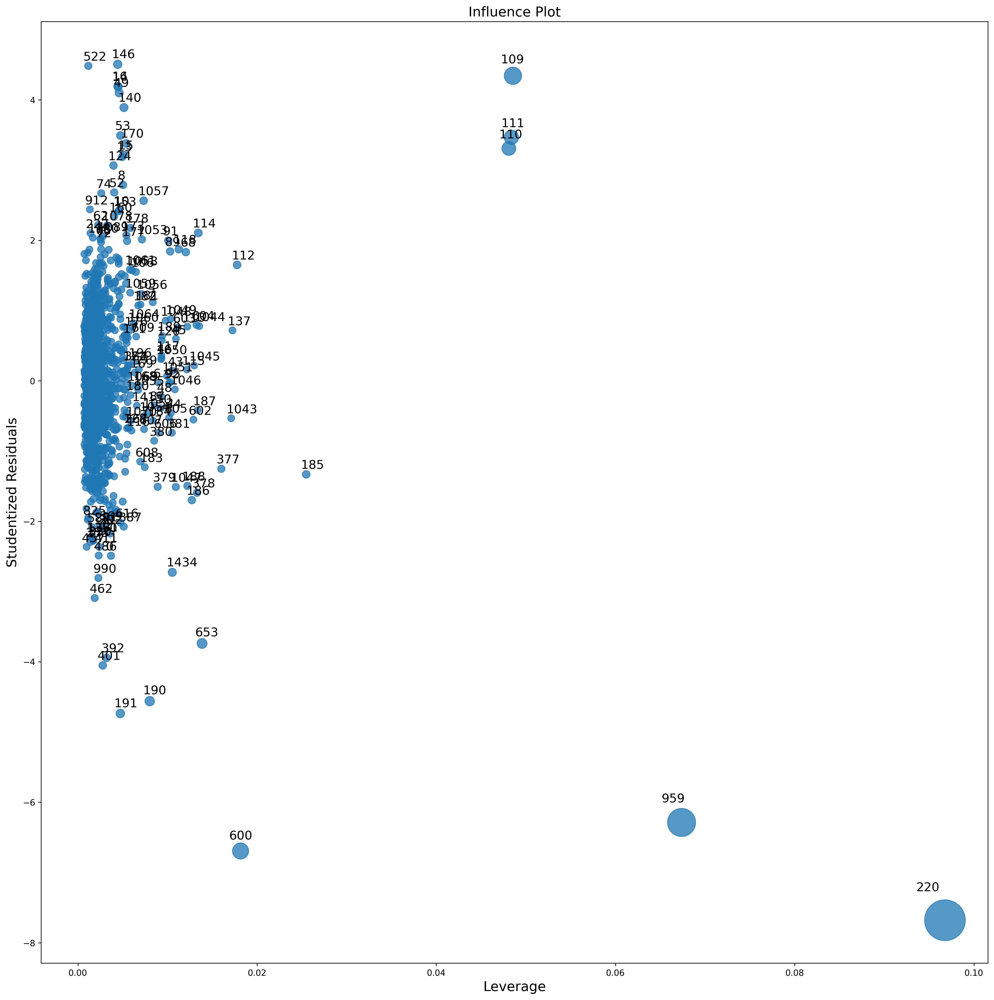

In [113]:
# Leverage Value using High Influence Points : Points beyond Leverage_cutoff value are influencers
fig,ax=plt.subplots(figsize=(20,20))
fig=influence_plot(model,ax = ax)
plt.show()

In [114]:
k=df_cont.shape[1]
n=df_cont.shape[0]
leverage_cutoff = (3*(k+1))/n
print('Cut-off line at',np.round(leverage_cutoff,2))

Cut-off line at 0.01


**Let's plot the influencers and also plot a cut off line using the stem plot**

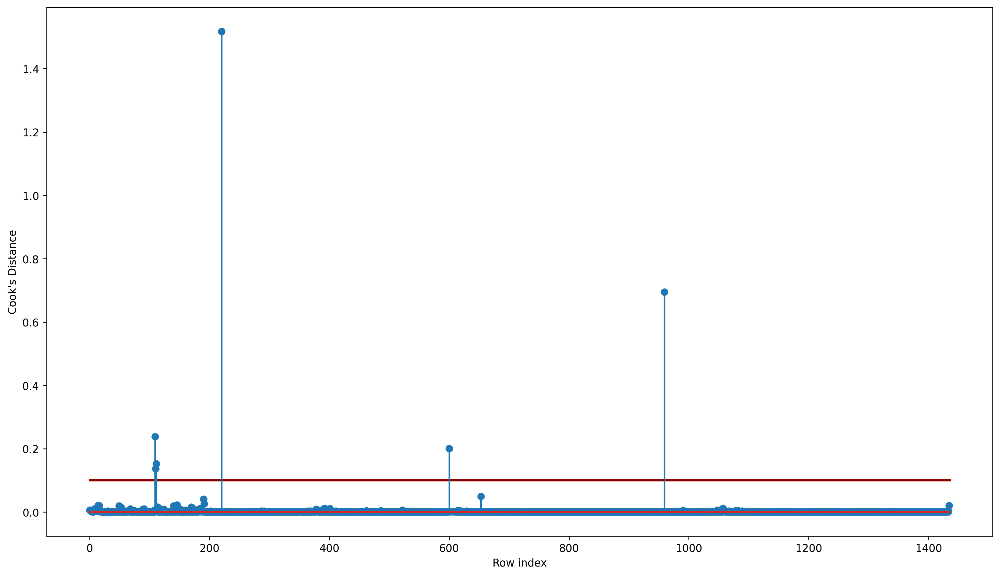

In [115]:
fig = plt.figure(figsize = (16,9))
x = [0,1435]
y = [0.1,0.1]
plt.plot(x, y,color='darkred', linewidth=2)
y1 = [0.01,0.01]
plt.plot(x , y1, color = 'red', linewidth = 2)
plt.stem(np.arange(len(df_cont)), np.round(c, 3))
plt.xlabel('Row index')
plt.ylabel("Cook's Distance")
plt.show()

In [116]:
# Index and value of influencer where C>0.5
np.argmax(c) , np.max(c)

(220, 1.5183498455717956)

In [117]:
df_cont[df_cont.index.isin([220])]

,Price,Age,KM,Weight
220,12450,44,74172,1615


In [118]:
#Let's improve the model by deleting the influence point and creating a new dataframe
df_f= df_cont.copy()
# Discard the data points which are influencers and reassign the row number (reset_index(drop=True))
df_f=df_f.drop(df_f.index[[220]],axis=0).reset_index(drop=True)
df_f.shape

(1434, 4)

## Model Deletion Diagnostics and Final Model

In [119]:
while model.rsquared < 0.90:
    for c in [np.max(c)>leverage_cutoff]:
        model=smf.ols('Price~Age+KM+Weight',data=df_f).fit()
        (c,_)=model.get_influence().cooks_distance
        c
        np.argmax(c) , np.max(c)
        df_f=df_f.drop(df_f.index[[np.argmax(c)]],axis=0).reset_index(drop=True)
        df_f
    else:
        model_f=smf.ols('Price~Age+KM+Weight',data=df_f).fit()
        model_f.rsquared , model_f.aic
        print("Thus model accuracy is improved to",model_f.rsquared)

Thus model accuracy is improved to 0.8578485217349112
Thus model accuracy is improved to 0.8632770464094519
Thus model accuracy is improved to 0.8607898879814079
Thus model accuracy is improved to 0.8581582611566131
Thus model accuracy is improved to 0.8554941807210751
Thus model accuracy is improved to 0.8573270219543844
Thus model accuracy is improved to 0.8593111598478697
Thus model accuracy is improved to 0.860225645330987
Thus model accuracy is improved to 0.8624893340871543
Thus model accuracy is improved to 0.8631949394421121
Thus model accuracy is improved to 0.8638982295278871
Thus model accuracy is improved to 0.8646931674774829
Thus model accuracy is improved to 0.8655914622411143
Thus model accuracy is improved to 0.8659064994817832
Thus model accuracy is improved to 0.8662670534586867
Thus model accuracy is improved to 0.8650450242099621
Thus model accuracy is improved to 0.8652057341292722
Thus model accuracy is improved to 0.8654490662150328
Thus model accuracy is improv

In [120]:
influence_points=model_f.get_influence()
c, p_value=influence_points.cooks_distance

In [121]:
df_f.shape

(910, 4)

In [122]:
df_f.shape

(910, 4)

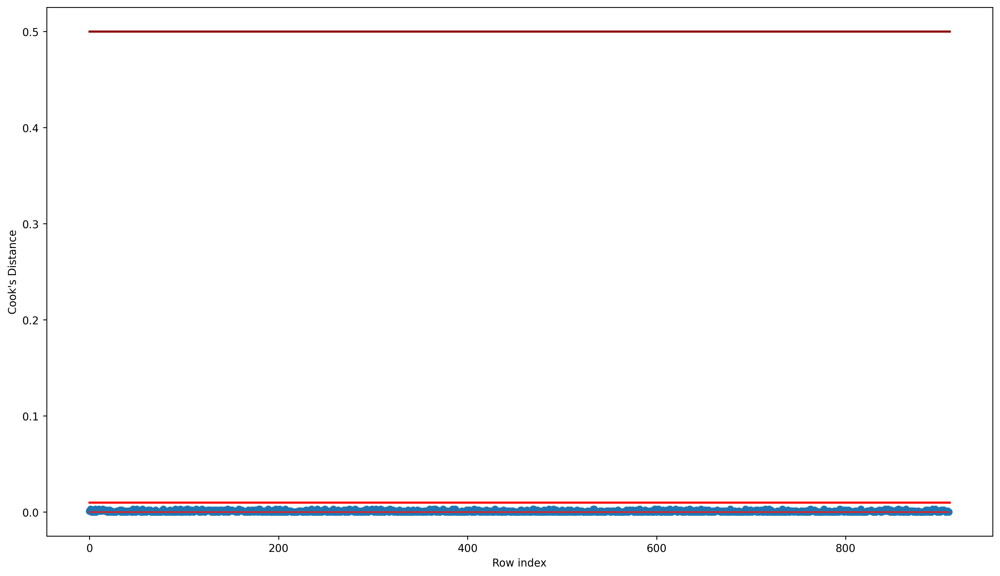

In [123]:
fig = plt.figure(figsize = (16,9))
x = [0,910]
y = [0.5,0.5]
plt.plot(x, y,color='darkred', linewidth=2)
y1 = [0.01,0.01]
plt.plot(x , y1, color = 'red', linewidth = 2)
plt.stem(np.arange(len(df_f)), np.round(c, 3))
plt.xlabel('Row index')
plt.ylabel("Cook's Distance")
plt.show()

*Hence, we can see that there are no influncers present in our model.*

In [124]:
model_f.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.900
Model:                            OLS   Adj. R-squared:                  0.900
Method:                 Least Squares   F-statistic:                     2730.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        18:46:51   Log-Likelihood:                -7101.9
No. Observations:                 910   AIC:                         1.421e+04
Df Residuals:                     906   BIC:                         1.423e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -112.5585    829.245     -0.136      0.892   -1740.023    1514.906
Age         -106.9351      1.706    -62.684      0.000    -110.283    -103.587
KM            -0.0110      0.001    -13.618      0.000      -0.013      -0.009
Weight        16.2236      0.758     21.390      0.000      14.735      17.712
==============================================================================
Omnibus:                       13.736   Durbin-Watson:                   1.870
Prob(Omnibus):                  0.001   Jarque-Bera (JB):                8.560
Skew:                           0.055   Prob(JB):                       0.0138
Kurtosis:                       2.538   Cond. No.                     3.09e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.09e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [125]:
rmse_f = np.sqrt(model_f.mse_resid)
rmse_f

594.4022234686771

In [126]:
# Complete